# <center>1017 Project 1: Demand Forecasting

<center> Prepared By:  
    
<center> Zhi Xin Zhu (1002117112)
<center>Angela Hsu (1003328874)
<center>Jiayue Xu (1002914162)
<center>Yinjie Yu (1002929913)
<center>Mengyao Wang (1002074970)
    

## Summary
   
   Demand forecasting in supply chain management refers to the process of planning or predicting the demand of materials to ensure suppliers can deliver the right products and in the right quantities to satisfy customer demand without creating a surplus or deficiency. In this project, the team aimed to implement two methods to predict future demand of the material based on the user inputs including client, material and date. The team forecasted the total demand for the given material from all clients at a specified future date when the customer information is not provided.  When material information is not offered, the team forecasted the total demand for all materials from the given client at a given future date. 

   In order to construct the predictive modeling, the team first considered applying the simple Moving Average method, which is a technique that simply calculated the average of a select set of time periods and then presented the overall trend in a data set. One of the most serious limitations is the difficulty to determine the optimal value of N. In order to limit the effect of the outliers, a large N is recommended. Moreover, the ARIMA model was proposed to generate predictions based on the synthesis of historical data patterns, which is a generalization of the simpler Autoregressive Moving Average and adds the notion of integration [1]. It makes use of lagged moving averages to smooth time series data and implicitly assumes that the future will resemble the past. For achieving higher reliability of ARIMA model in the long run, the team suggested to import new data into the model. The team presented the different factors that would affect the accuracy of prediction models and all the results obtained would be discussed in detail in the following report.  

In [1]:
import warnings
import itertools
import numpy as np
import matplotlib.pyplot as plt
warnings.filterwarnings("ignore")
plt.style.use('fivethirtyeight')
import pandas as pd
import statsmodels.api as sm
import matplotlib
matplotlib.rcParams['axes.labelsize'] = 14
matplotlib.rcParams['xtick.labelsize'] = 12
matplotlib.rcParams['ytick.labelsize'] = 12
matplotlib.rcParams['text.color'] = 'k'
import copy
import warnings
warnings.filterwarnings('ignore')

## 1. Exploratory Data Analysis

The dataset *'project1_data.csv'* is used for this project. Each entry of the dataset represents a sales record of certain material. The dataset includes four columns. 
1. Date: This column represents the date of the sale. The values range from '2019-12-05' to '2020-02-24’
2. Client: This column represents the client who initiate this sale. There are 10 unique client. The value range from 'c1' to 'c10' 
3. Material: This column represents the material being purchased. There are 20 unique materials. 
4. Order Quantity: This column represents the order quantity of the given material

In order to forecast the demand of certan material by a certain client, the team identified each unique pair client and material. In the given data, there are 118 unique pairs of client and material. The team then discovered that some clients order the same material multiple times on the same date. The team aggregate these orders into one entry for the convenience of later implementation. 

After that, the team collated the aggregate demand for each material from each client on a specific date. In order to deal with such a condition that the data and client are given and materials are unknown, the team showed the total number of materials ordered by each client on each date. Considered the client information may not be provided, the team displayed how much of each material was ordered by all clients on each given date. In the final step of processing the dataframe, the team fill ‘0’s on the days to solve the problem that clients did not purchase materials on a daily basis so that for each pair of unique client and material, the time difference between each data points are constant. 

In [2]:
df = pd.read_csv("project1_data.csv")
#convert to datetime dtype
df['Date'] = df['Date'].astype('datetime64[ns]')
df = df[['Date', 'Order Quantity','Client','Material']]
df = df.sort_values(by=['Date'])
df['Date'].min(), df['Date'].max()

(Timestamp('2019-12-05 00:00:00'), Timestamp('2020-02-24 00:00:00'))

In [3]:
# unique value of client and material
client_list = np.sort(df.Client.unique())
material_list = np.sort(df.Material.unique())
print('There are {} unique client and {} unique material.'.format(len(client_list), len(material_list)))

There are 10 unique client and 20 unique material.


In [4]:
# unique pair of client and material 
unique_input = df.groupby(['Client','Material']).size().reset_index().rename(columns={0:'count'})
print('There are {} unique pairs of client and material'.format(len(unique_input)))

There are 118 unique pairs of client and material


#### Aggregate multiple order on the same date

In [5]:
## aggregate demand for same material, client on same date
newdf = df.loc[ [0 , 2] , : ]
for i in range(len(unique_input)):
    subset = df.loc[(df['Client'] == unique_input.iloc[ i, 0 ]) & (df['Material'] == unique_input.iloc[ i , 1 ])]
    subset = subset.drop(['Client', 'Material'], axis=1)
    subset = subset.groupby('Date').sum('Order Quantity')
    subset.reset_index(inplace=True)
    subset['Client']=  unique_input.iloc[ i , 0 ]
    subset['Material'] = unique_input.iloc[ i, 1 ]
    newdf = newdf.append(subset)

newdf = newdf.iloc[2:]
newdf = newdf.sort_values(by=['Date'])
# newdf

#### Aggregate all demand of materials for each client 

In [6]:
#### Aggregate all material; given client 
df_ac = df.loc[ [0 , 2] , : ]
date_list = np.sort(df.Date.unique())
date_list = pd.DataFrame(date_list)
date_list['Fill'] = 0
for i in range(len(date_list)):
    subset = df.loc[(df['Date'] == date_list.iloc[i,0])]
    subset = subset.drop(['Date', 'Material'], axis=1)
    subset = subset.groupby('Client').sum('Order Quantity')
    subset['Material'] = 0
    subset['Date'] = date_list.iloc[i,0]
    subset.reset_index(inplace=True)
    subset = subset[['Date', 'Order Quantity','Client','Material']]
    df_ac = df_ac.append(subset)    
df_ac = df_ac.iloc[2:]
df_ac = df_ac.sort_values(by=['Date'])

#### Aggregate all client demand for each material

In [7]:
#### Aggregate all client; given material 
df_am = df.loc[ [0 , 2] , : ]
for i in range(len(date_list)):
    subset = df.loc[(df['Date'] == date_list.iloc[i,0])]
    subset = subset.drop(['Date', 'Client'], axis=1)
    subset = subset.groupby('Material').sum('Order Quantity')
    subset['Client'] = 'all'
    subset['Date'] = date_list.iloc[i,0]
    subset.reset_index(inplace=True)
    subset = subset[['Date', 'Order Quantity','Client','Material']]
    df_am = df_am.append(subset)    
df_am = df_am.iloc[2:]
df_am = df_am.sort_values(by=['Date'])

In [8]:
unique_input_all = unique_input
unique_input_all = unique_input_all.append(df_ac.groupby(['Client','Material']).size().reset_index().rename(columns={0:'count'}))
unique_input_all = unique_input_all.append(df_am.groupby(['Client','Material']).size().reset_index().rename(columns={0:'count'}))
# unique_input_all

#### Add missing date and fill with 0

In [9]:
#### resample, fill in missing date and set demand as zero for each unique pair
filleddf = df.loc[ [0 , 2] , : ]
alldates = pd.date_range('2019-12-05', '2020-02-24')
alldates = pd.DataFrame(alldates, columns = ['Date'])
new_date_list = copy.deepcopy(alldates)
new_date_list['Order Quantity'] = 0
new_date_list.columns = ['Date', 'Order Quantity']
for i in range(len(unique_input)):
    subset = df.loc[(df['Client'] == unique_input.iloc[ i, 0 ]) & (df['Material'] == unique_input.iloc[ i , 1 ])]
    f_subset = copy.deepcopy(new_date_list)
    f_subset['Client']=  unique_input.iloc[ i , 0 ]
    f_subset['Material'] = unique_input.iloc[ i, 1 ]
    f_subset = f_subset[['Date', 'Order Quantity','Client','Material']]
    subset = subset.append(f_subset)
    subset = subset.drop(['Client', 'Material'], axis=1)
    subset = subset.groupby('Date').sum('Order Quantity')
    subset.reset_index(inplace=True)
    subset['Client']=  unique_input.iloc[ i , 0 ]
    subset['Material'] = unique_input.iloc[ i, 1 ]
    filleddf = filleddf.append(subset)

filleddf = filleddf.iloc[2:]
filleddf = filleddf.sort_values(by=['Date'])
# filleddf

In [10]:
#### resample, fill in missing date and set demand as zero for each client
new_client_list = pd.DataFrame(client_list)
new_client_list['Material'] = 0
new_client_list['Order Quantity']= 0
new_client_list.columns = ['Client', 'Material','Order Quantity']
filleddf_ac = df.loc[ [0 , 2] , : ]
for i in range(len(alldates)):
    subset = df.loc[(df['Date'] == alldates.iloc[i,0])]
    f_subset = copy.deepcopy(new_client_list)
    f_subset['Date'] = alldates.iloc[i,0]
    f_subset = f_subset[['Date', 'Order Quantity','Client','Material']]
    subset = subset.append(f_subset)
    subset = subset.drop(['Date', 'Material'], axis=1)
    subset = subset.groupby('Client').sum('Order Quantity')
    subset['Material'] = 0
    subset['Date'] = alldates.iloc[i,0]
    subset.reset_index(inplace=True)
    subset = subset[['Date', 'Order Quantity','Client','Material']]
    filleddf_ac = filleddf_ac.append(subset)    

filleddf_ac = filleddf_ac.iloc[2:]
filleddf_ac = filleddf_ac.sort_values(by=['Date'])
# filleddf_ac

In [12]:
#### resample, fill in missing date and set demand as zero for each material
new_material_list = pd.DataFrame(material_list)
new_material_list['Client'] = 'all'
new_material_list['Order Quantity']= 0
new_material_list.columns = ['Material', 'Client','Order Quantity']
filleddf_am = df.loc[ [0 , 2] , : ]
for i in range(len(alldates)):
    subset = df.loc[(df['Date'] == alldates.iloc[i,0])]
    f_subset = copy.deepcopy(new_material_list)
    f_subset['Date'] = alldates.iloc[i,0]
    f_subset = f_subset[['Date', 'Order Quantity','Client','Material']]
    subset = subset.append(f_subset)
    subset = subset.drop(['Date', 'Client'], axis=1)
    subset = subset.groupby('Material').sum('Order Quantity')
    subset['Client'] = 'all'
    subset['Date'] = alldates.iloc[i,0]
    subset.reset_index(inplace=True)
    subset = subset[['Date', 'Order Quantity','Client','Material']]
    filleddf_am = filleddf_am.append(subset)    

filleddf_am = filleddf_am.iloc[2:]
filleddf_am = filleddf_am.sort_values(by=['Date'])
# filleddf_am

## 1.1 Visualization of Data 
In order to visualize the dataset given, the team constructed demand plot for each scenarios. 

### 1) Aggregated Demand of Material for each Client
The following plots illustate the total material demand of each client changed over time. In general, there is no specific pattern of change.

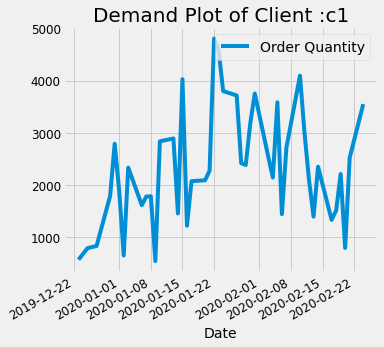

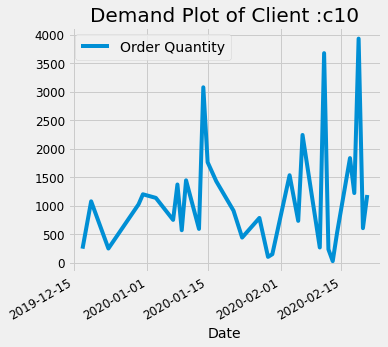

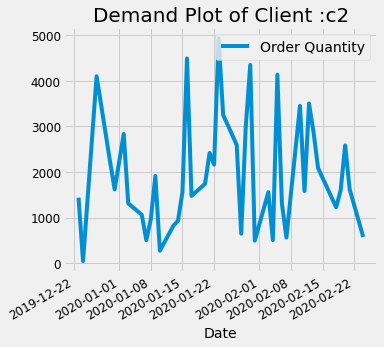

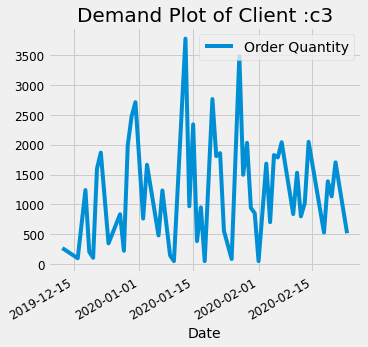

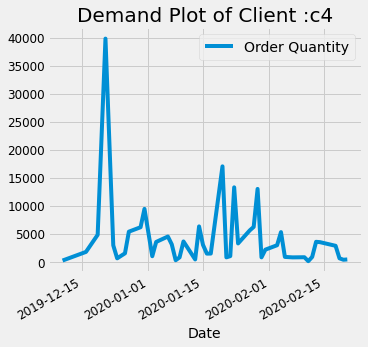

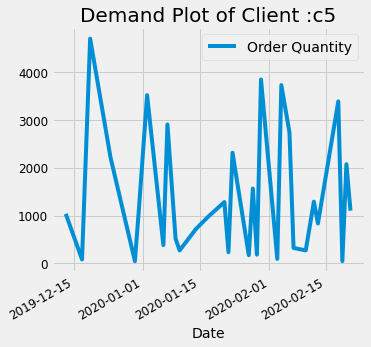

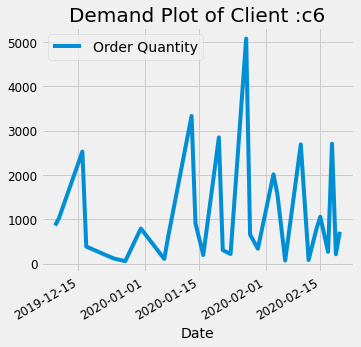

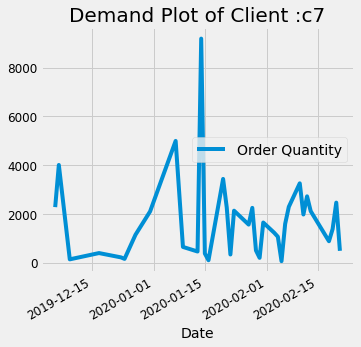

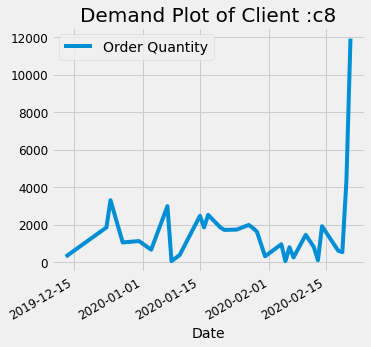

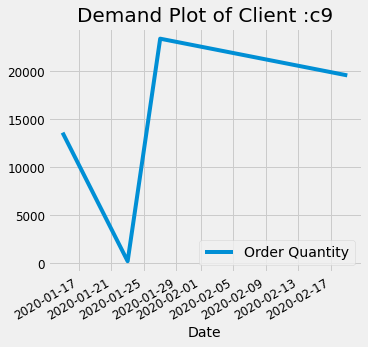

In [13]:
df_ac_plt = df_ac.set_index('Date')
df_ac_plt = df_ac_plt.drop(['Material'], axis=1)
for i in range(len(client_list)):

    subset = df_ac_plt.loc[(df_ac_plt['Client'] == client_list[i])] 
    subset.plot(figsize = ((5,5)))
    plt.title('Demand Plot of Client :'+ client_list[i], fontsize = 20)
    plt.show()
# df_ac_plt

### 2) Aggregated Demand of Clients for each Material 

The following plots illustate the total client demand of each material changed over time. It was clear that the order quantity of the following three materials (12160666, 12246740, 12293768) remained stable and other materials experienced considerable fluctuations over the period.

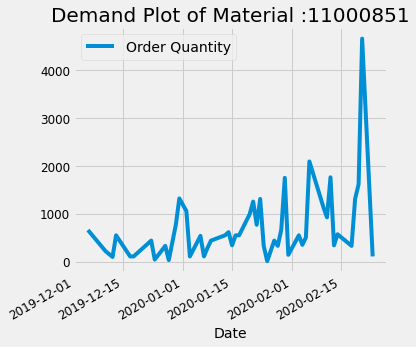

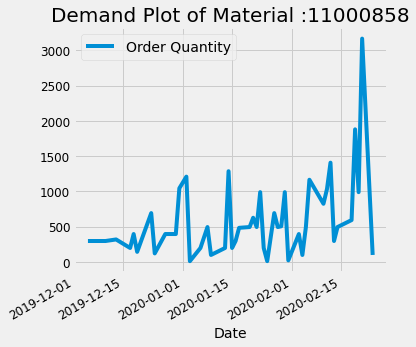

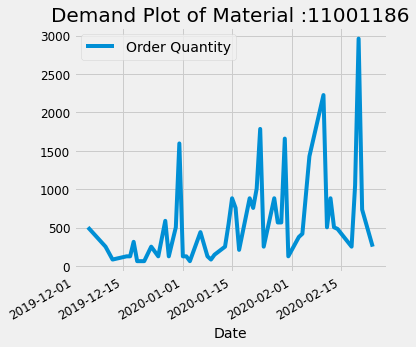

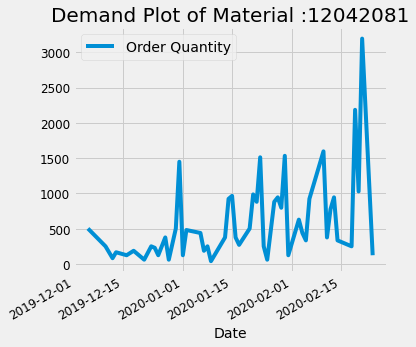

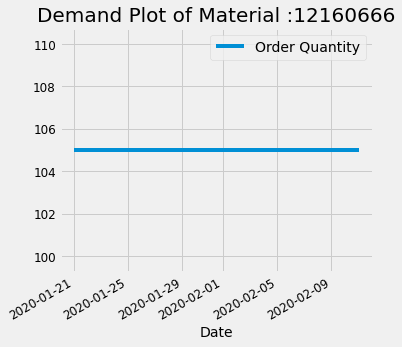

...

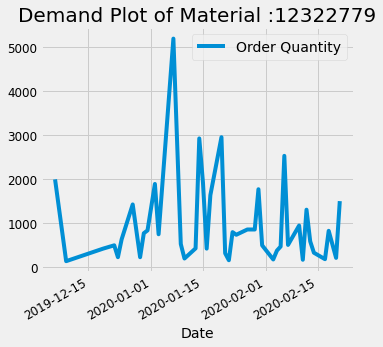

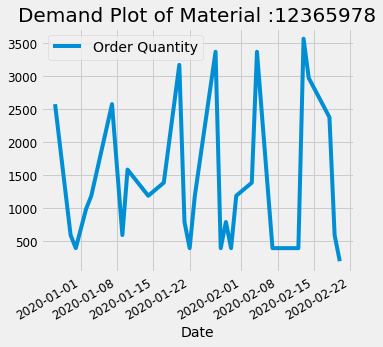

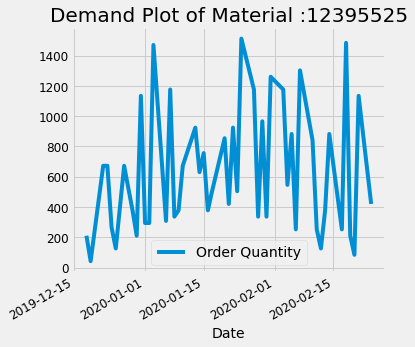

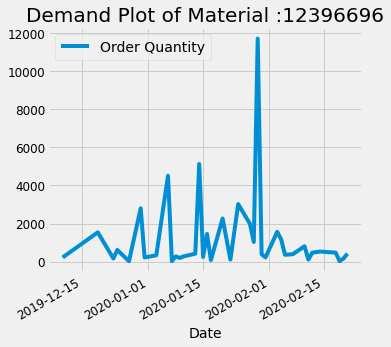

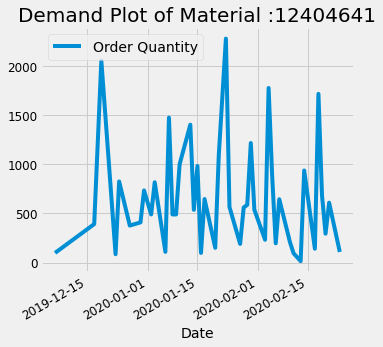

In [14]:
df_am_plt = df_am.set_index('Date')
df_am_plt = df_am_plt.drop(['Client'], axis=1)
for i in range(len(material_list)):
    subset = df_am_plt.loc[(df_am_plt['Material'] == material_list[i])] 
    subset = subset.drop(['Material'], axis=1)
    subset.plot(figsize = ((5,5)))
    plt.title('Demand Plot of Material :'+ str(material_list[i]), fontsize = 20)
    plt.show()

### 3) Demand of Client for a given Material

The following plots illustrate the demand of each unique pair of client and material. From the plots, the team can visually see how each client’s demand for each material changes over time. 

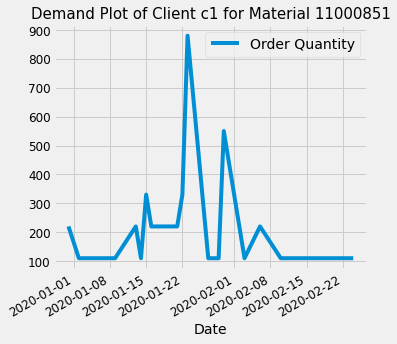

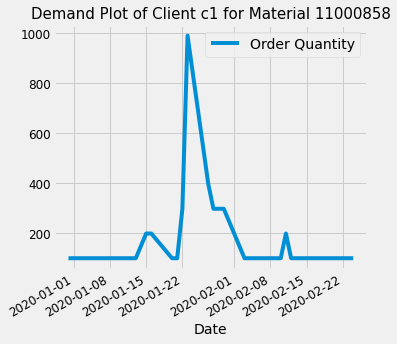

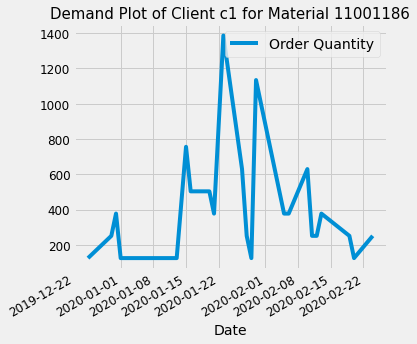

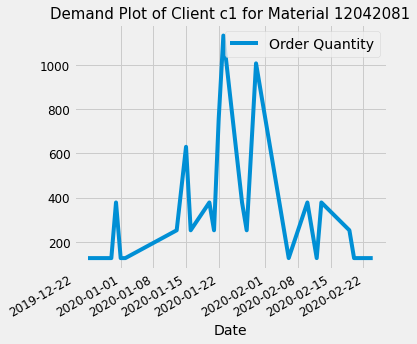

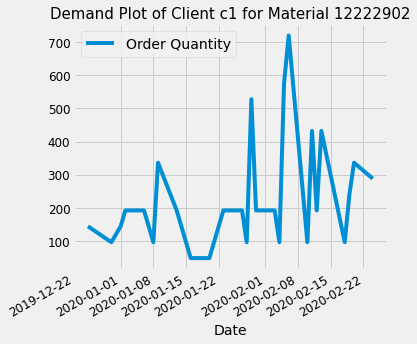

...

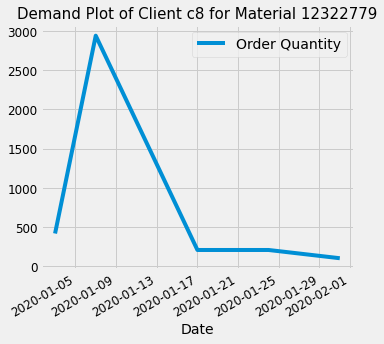

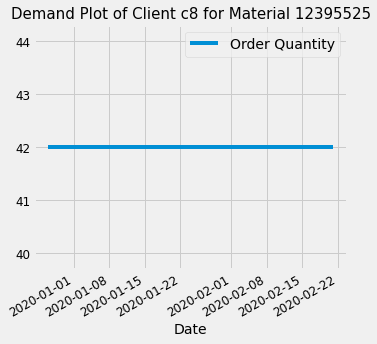

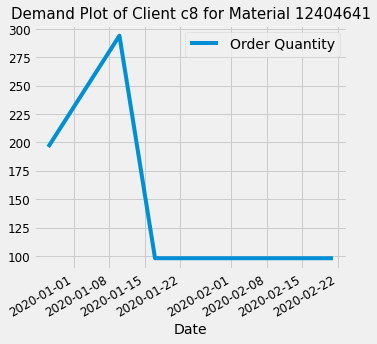

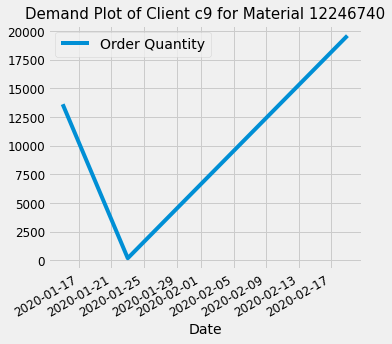

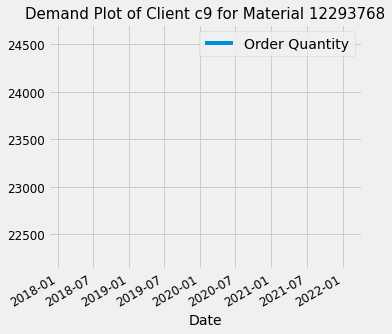

In [15]:
df_plt = newdf.set_index('Date')
for i in range(len(unique_input)):
    subset = df_plt.loc[(df_plt['Client'] == unique_input.iloc[ i, 0 ]) & (df_plt['Material'] == unique_input.iloc[ i , 1 ])]
    subset = subset.drop(['Client', 'Material'], axis=1)
    subset.plot(figsize = ((5,5)))
    c = unique_input.iloc[i,0]
    m = unique_input.iloc[i,1]
    plt.title('Demand Plot of Client {} for Material {}'.format(c,m) , fontsize = 15)
    plt.show()

# 2. Methods
In this project, the team will implement 2 methods to forecast the future demand of materials. One of the method is moving average which is covered by the course and another is autoregressive integrated moving average which is out of the scope of the course. 

## 1) Simple Moving Average

In time series analysis, simple moving average is one of widely known technical indicators to forecast future data[2].The simple moving average also refers to equally weighted moving average, so basically, the forecasting item can be calculated as the arithmetic average of the most recent N observations, where N stands for number of periods. The equation shows as below: 

 <img src="ma_formula.png" width="150">
 

A simple moving average can eliminate volatility and make it easier to observe the trend of data [3]. If the simple moving average is up, it means that the data is on an upward trend. If it points down, it means that the observed data has also dropped. The longer the time range of the moving average, the smoother the simple moving average. Compared with long-term data, short-term moving averages are more unstable, but their readings are closer to the source data. In addition, this method can be regarded as foundation of many other time series decomposition methods, so understanding the principle and obtaining the forecasted data in this way could be significant.  

In this project, several assumptions and actions were made when dealing with raw data. The dataset consists of four main parts which are date, client, material, and demand. However, there are time intervals existing in date because clients do not purchase specific material regularly. Thus, in order to satisfy the requirement of stationary time series, a ‘zero’ is filled on the days that they did not make orders. After filling the blanks, the forecasting can be made on daily basis. In exploratory data analysis, we classify the dataset into 148 different time series, so that we can forecast more conditions on different days. The first condition is that both client and buying material are given, here, we are given ten clients, c1-c10, and twenty different materials and is found that there are 118 different pairs. Furthermore, when there is only one of the material or the client, for example, c1 is given, then all kinds of material that c1 will buy are aggregated and then perform a forecast. The same is true for the material. In addition, N in this project is chosen as 7 because the data given is over 3 months approximately which is not sufficient to deal as a monthly based dataset. In theory, an optimal N can be determined by analyzing root mean squared error (RMSE) [3]. 

However, there are some limitations when applying SMA. Firstly, when determining the optimal N, there is a tradeoff between two effects: filtering out more noise vs responding to trends and changes slowly [3]. If a large N is used, it would be beneficial when there is an outlier which is unreasonably large or small, by taking the average, the effect of this outlier can be minimized. However, a large N also means application of more outdated datapoints which do not effectively reflect the current trend is moving with. At the same time, SMA heavily rely on outdated date because the data several days or even years ago shares the same weight as just one day before [4].


## 2) Autoregressive Integrated Moving Average (ARIMA)
ARIMA stands for the abbreviation of Auto Regressive Integrated Moving Average. It is a class of model applied to forecast future value given a specified time series with introducing past values. Except the past demand data, corresponding lags and lagged forecasting errors are involved. Similar to moving average methodology, there is no seasonal time series included in the given dataset, thus ARIMA would not be updated to SARIMA (short for ‘Seasonal ARIMA’).  

In a typical ARIMA model, it is characterized by three factors, denoted as *p*, *d* and *q* [5], where 

- *p* is the order of the Auto Regressive term, which is the number of lag observations in the model, 

- *q* is the order of the Moving average term, which is the size of the moving average window, 

- *d* is the number of differencing required to make the time series stationary. 

 

In the linear regression model, to utilize the lags as prediction terms, it is essential to guarantee all predictors are not correlated and independent of each other, which refers to form a stationary time series. Therefore, the direct idea come as differencing, where introduces subtraction of the previous value from the current value. To quantify the minimum number of differencing steps to force the time series stationary, autocorrelation plots are generated to visualize the stationary tendency. Further, via setting a tolerance (RMSE), for loop is introduced to iterate the corresponding value sets of p, d and q for three scenarios. The principle behind is explained by inspection of partial autocorrelation (PACF). It defines the correlation between the series and its lag, while excluding the contributions from the intermediate lags. Mathematically, the generalized expression for AR model is given as [6] 

 <img src="ar_f1.png" width="150">
 
 

Therefore, the higher order AR model has, the more demand data will be included into iteration.  

Then, MA model, depends on past forecast errors to make predictions, where correspond model is expressed as 

 <img src="ar_f2.png" width="150">
 
 

Finally, it is found that the ideal parameters are (1, 0, 3), (1, 1, 5) and (1, 0, 4) respectively. For the cases value 0 is assigned to p, it exhibits the correspond time series are already stationary, which proved by the converging trend with lags going on the autocorrelation plots.  

Like MA methodology, ARIMA model merely requires data in short time series to generalized forecast. As in this project, although only three-month period data is available, the application of ARIMA model, it is feasible to forecast future demand in the long run. However, due to the scatter distribution of demand over the given time period, the forecasted daily demand in the future could not be accurate according to ARIMA model. The explanation thereof is same as reasons related to MA methodology. Additionally, another noticeable limitation states that the reliability of forecast demand in the future (especially after May 2020) is not high. In the long term, the demand is anticipated to reach stable, while keeping varying in a limited range. Meanwhile, due to limited number of datasets in short period, ARIMA would evaluate all data points. So, if there are any turning points existing, the forecasting would be poor, unless they could refer to a return to a long-run equilibrium [6]. Thus, to achieve higher reliability for ARIMA model in the long run, it is essential to import new data into the model. So, it can be reproduced by other forecasters. Besides, compared with simple models, traditional model identification techniques would be difficult to understand, time consuming and computationally expensive [6]. As the procedure turns to be subjective, the reliability of forecasted result highly depends on the experience and capability of forecasters. Also, for low budget and short time schedule cases, ARIMA model is economically unfeasible. The last flaw is that ARIMA model is not embedded within any inherent theoretical models or structural relationships [7]. Thus, it is hard to quantify the economic significance of the given model. Compared with any structured model, policy simulations are not ideal realms to operate ARIMA models. 


# 3. Explanation of Major Functions in the Program


## 1） Simple Moving Average (MA)

For the moving average forecasting program that accepts three user inputs (client, material, date), there are two main steps to follow. The first step is to recognize the inputs and check whether there is any input variable out of range: 

- If client input is not in the client list “c1, ...., c10”, the function prints out 'No existing client';  

- if material input is not included in the 20 unique material types, prints out 'No existing material';  

- if both client and material inputs do not exist in the purchase history ever, prints out 'Client never purchased this material'.  

After checking all the input variables, the second step is to forecast the demand based on three different scenarios.  

1. When the client is not given, the function will forecast the aggregated demand for the given material based on the preprocessed dataset filleddf_am;  

2. When material is not given, the function will forecast the aggregated demand for the given client based on the preprocessed dataset filleddf_ac.  

3. When both client and material are given, the demand for the given client and material is forecasted based on the preprocessed dataset filleddf that contains all the unique pair.  

For this step, all scenarios forecast the demand using the rolling window function that makes a count of the average demand made in the 7-day window preceding that day. 

In [16]:
combined = []
for i in range(len(unique_input)):
    c = unique_input.iloc[i,0]
    m = str(unique_input.iloc[i,1])
    cm = str(c+m)
    combined.append(cm)
# ui_copy = copy.deepcopy(unique_input)
# ui_copy['Combined'] = combined

In [17]:
def ma_forecast(client,material,date):
    time = pd.date_range(end = date, periods = 8)
    start_date = str(time[0].date())
    end_date = str(time[-2].date())

    #check if pair, client, material exist 
   
    m_str = str(material)
    cm = str(client+m_str)
    
    if client not in client_list and client != 'all':
        print ('No existing client')
    elif material not in material_list and material != 0:
        print ('No existing material')
    elif cm not in combined and client != 'all'and material != 0:
        print('Client never purchased this material')
    elif client == 'all':
        after_start_date = filleddf_am["Date"] >= start_date
        before_end_date = filleddf_am["Date"] <= end_date
        between_two_dates = after_start_date & before_end_date
        filtered_dates = filleddf_am.loc[between_two_dates]
        mat = filtered_dates[filtered_dates['Material'].astype(str).str.contains(str(material))]
        forecast = mat["Order Quantity"].rolling(window=7).mean()
        print ('The demand forecast for material {} is: {}'.format(material, np.array(forecast)[-1]))
        
    elif material == 0:
        after_start_date = filleddf_ac["Date"] >= start_date
        before_end_date = filleddf_ac["Date"] <= end_date
        between_two_dates = after_start_date & before_end_date
        filtered_dates = filleddf_ac.loc[between_two_dates]
        cli = filtered_dates[filtered_dates['Client']==client]
        forecast = cli["Order Quantity"].rolling(window=7).mean()
        print ('The demand forecast of client {} is: {}'.format(client, np.array(forecast)[-1]))
    
    else:
        after_start_date = filleddf["Date"] >= start_date
        before_end_date = filleddf["Date"] <= end_date
        between_two_dates = after_start_date & before_end_date
        filtered_dates = filleddf.loc[between_two_dates]
        pair = filtered_dates[(filtered_dates['Client']==client) &\
                              (filtered_dates['Material'].astype(str).str.contains(str(material)))]
        forecast = pair["Order Quantity"].rolling(window=7).mean()
        print ('The demand forecast of client {} for material {} is: {}'.format(client, material, np.array(forecast)[-1]))

## 2) Auto Regressive Integrated Moving Average (ARIMA)
Unlike the moving average method where the forecasted demand is calculated directly using historical data, we will use the built-in ARIMA model available in the *statsmodel* package to implement the ARIMA method. A time series is fitted with corresponding historical data for each type of clients and material and each unique pair of clients and material that we identified earlier in EDA. Each time series has its own corresponding tuned hyperparameters. The time series models are stored in lists. The main program will call these models to make predictions.  

The main ARIMA program requires three inputs to compute a forecast. The inputs are client, material, and date. The function will first check the validity of the inputs through series of if statements, similar to the moving average method. After validating the inputs, the function will determine which time series model should be used: 

- if client input (== all) is not available, the function will choose the corresponding time series based on material input and will return the aggregated forecast for that material on the given date  

- If material input (==0) is not available, the function will choose the corresponding time series based on the client input and will print the aggregated forecast for that client on the given date.  

- If both material and client are given, the function will choose the corresponding time series based on the material and client input and will print the forecasted demand of that client for that material on the given date. 

#### i) Autocorrelation Plot of Aggregate Demand for each Client 

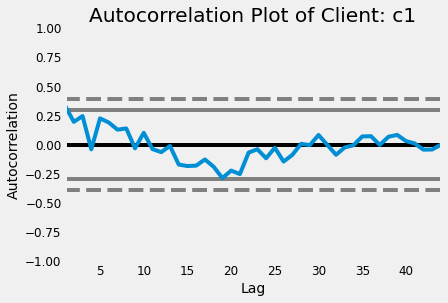

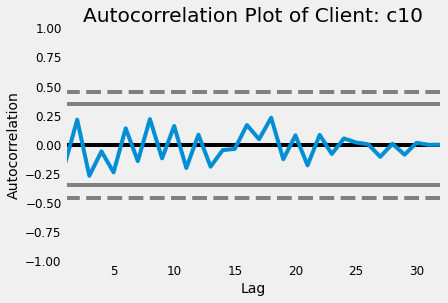

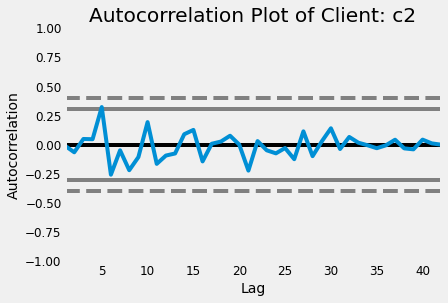

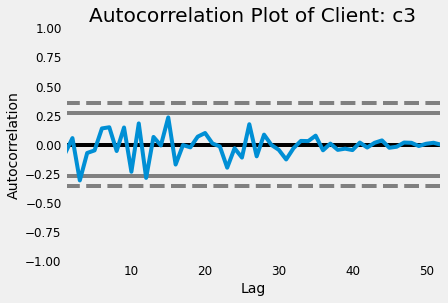

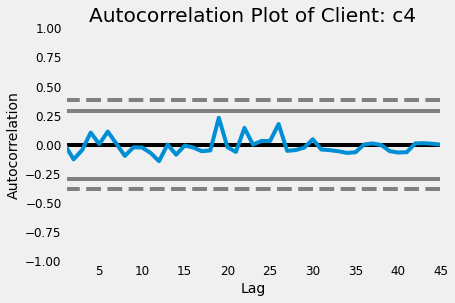

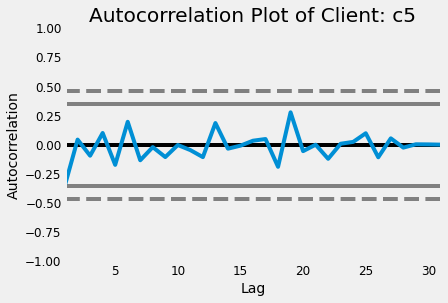

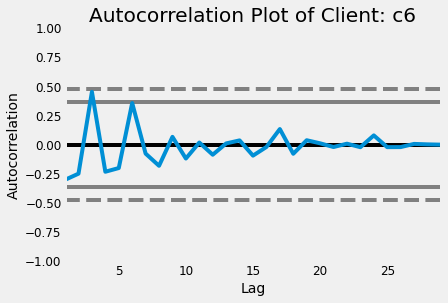

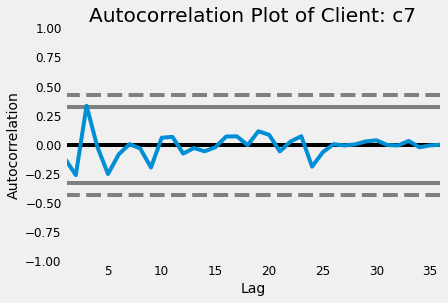

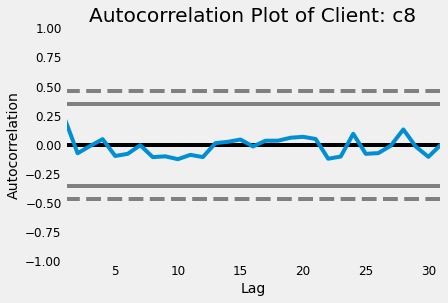

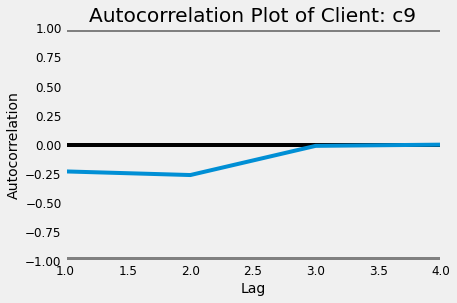

In [24]:
## autocorrelation plot to determine order of lag (p)
###Aggreagate demand of client
from statsmodels.tsa.arima.model import ARIMA
from pandas.plotting import autocorrelation_plot
for i in range(len(client_list)):
    subset = df_ac_plt.loc[(df_ac_plt['Client'] == client_list[i])] 
    subset = subset.drop(['Client'], axis=1)
    autocorrelation_plot(subset)
    plt.title('Autocorrelation Plot of Client: {}'.format(client_list[i]))
    plt.show()

#### ii) Autocorrelation Plot of Aggregate Demand for each Material 

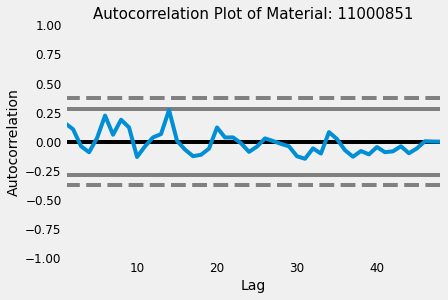

<Figure size 576x720 with 0 Axes>

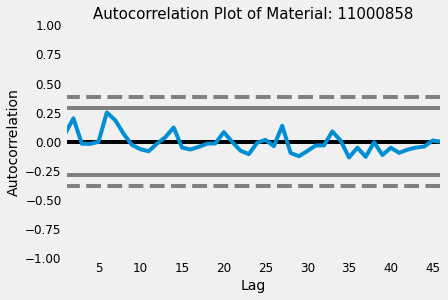

<Figure size 576x720 with 0 Axes>

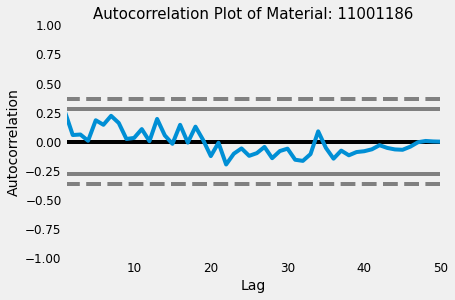

<Figure size 576x720 with 0 Axes>

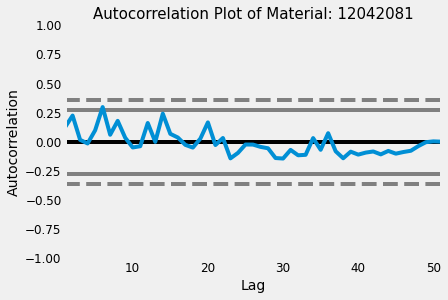

<Figure size 576x720 with 0 Axes>

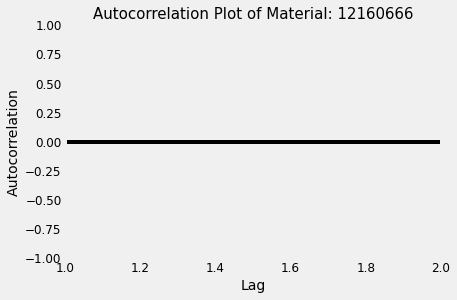

<Figure size 576x720 with 0 Axes>

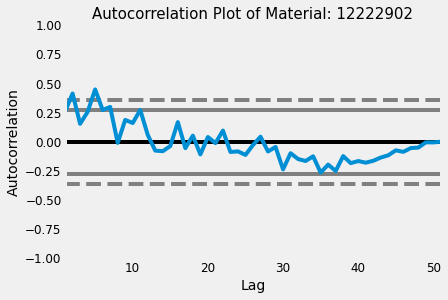

<Figure size 576x720 with 0 Axes>

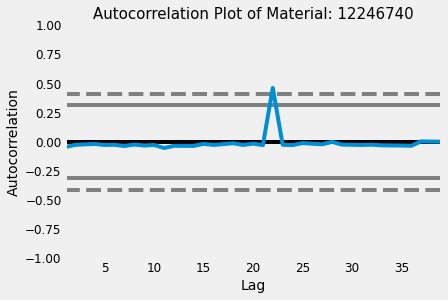

<Figure size 576x720 with 0 Axes>

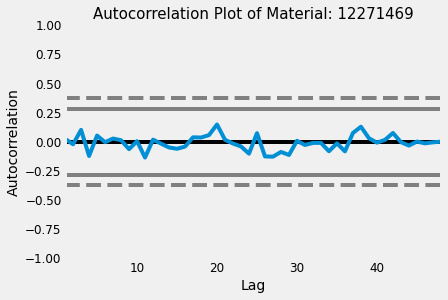

<Figure size 576x720 with 0 Axes>

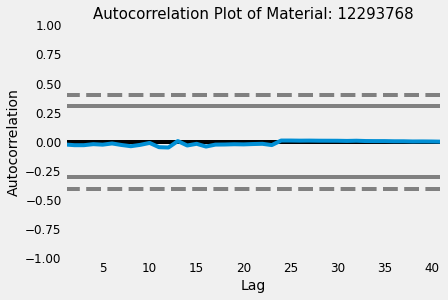

<Figure size 576x720 with 0 Axes>

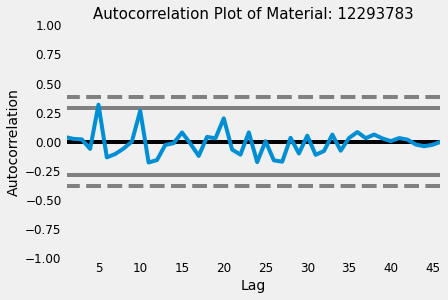

<Figure size 576x720 with 0 Axes>

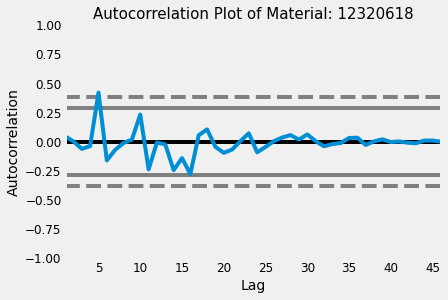

<Figure size 576x720 with 0 Axes>

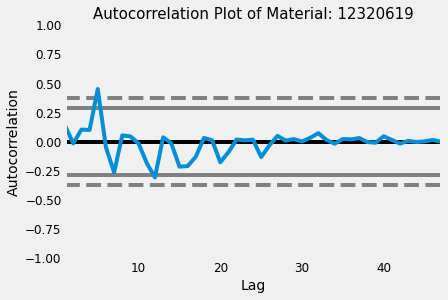

<Figure size 576x720 with 0 Axes>

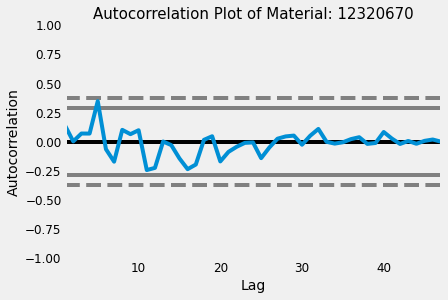

<Figure size 576x720 with 0 Axes>

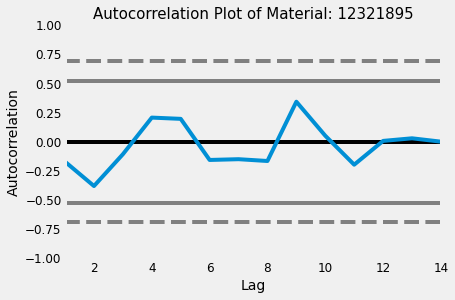

<Figure size 576x720 with 0 Axes>

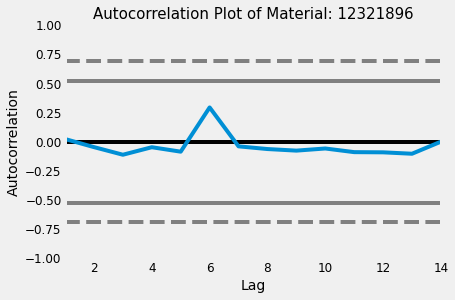

<Figure size 576x720 with 0 Axes>

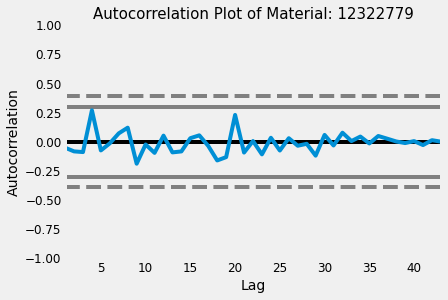

<Figure size 576x720 with 0 Axes>

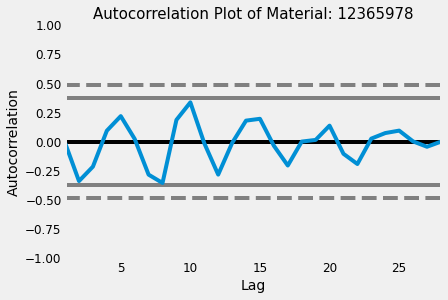

<Figure size 576x720 with 0 Axes>

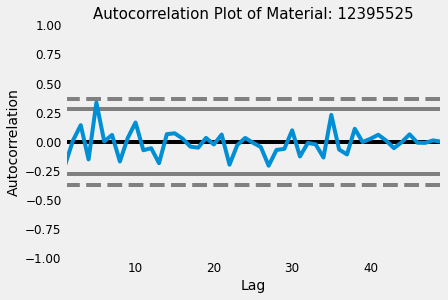

<Figure size 576x720 with 0 Axes>

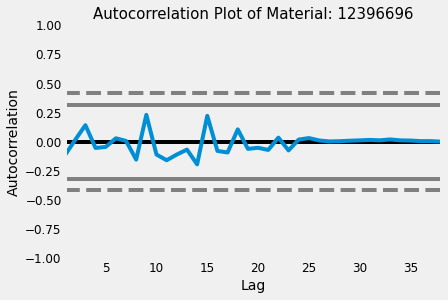

<Figure size 576x720 with 0 Axes>

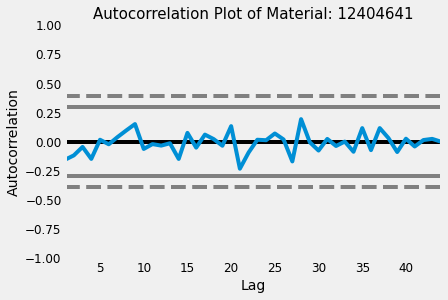

<Figure size 576x720 with 0 Axes>

In [25]:
## autocorrelation plot to determine order of lag (p)
###Aggreagate demand of material
for i in range(len(material_list)):
    subset = df_am_plt.loc[(df_am_plt['Material'] == material_list[i])] 
    subset = subset.drop(['Material'], axis=1)
    autocorrelation_plot(subset)
    plt.title('Autocorrelation Plot of Material: {}'.format(material_list[i]), fontsize = 15)
    plt.figure(figsize=(8,10))
    plt.show()

#### iii) Autocorrelation Plot of each Unique Pair of Client and Material 

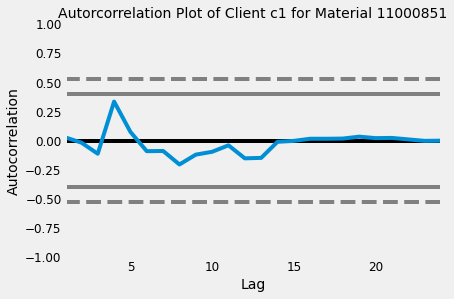

<Figure size 576x1152 with 0 Axes>

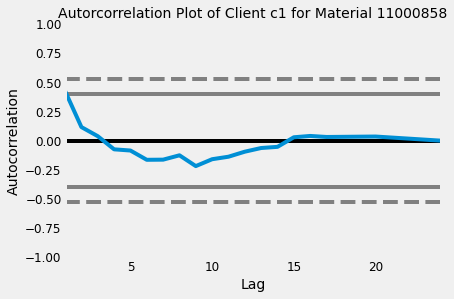

<Figure size 576x1152 with 0 Axes>

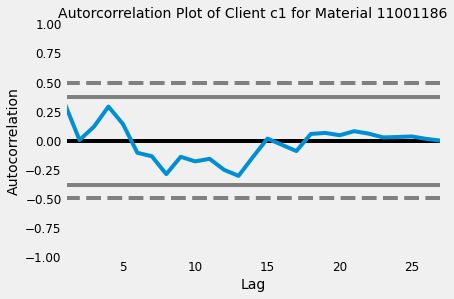

<Figure size 576x1152 with 0 Axes>

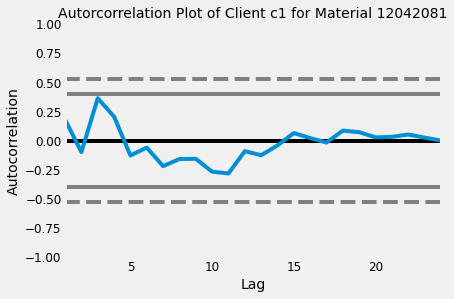

<Figure size 576x1152 with 0 Axes>

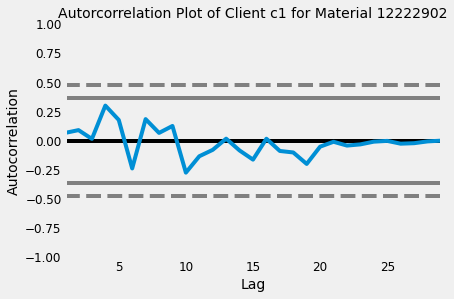

<Figure size 576x1152 with 0 Axes>

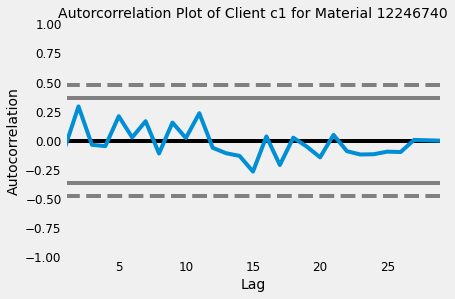

<Figure size 576x1152 with 0 Axes>

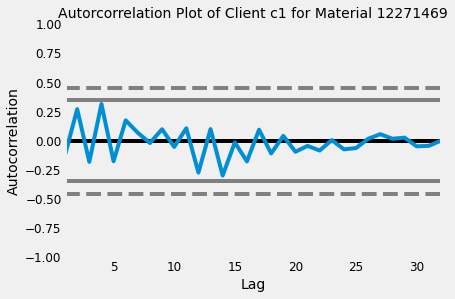

<Figure size 576x1152 with 0 Axes>

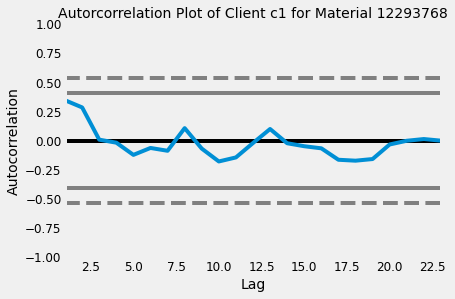

<Figure size 576x1152 with 0 Axes>

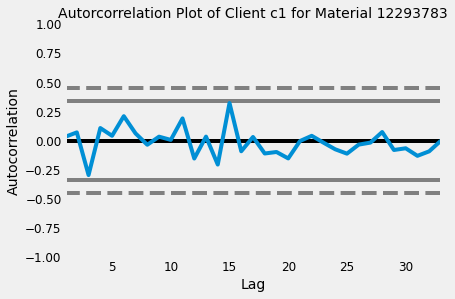

<Figure size 576x1152 with 0 Axes>

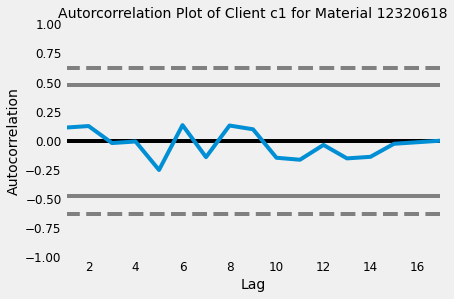

<Figure size 576x1152 with 0 Axes>

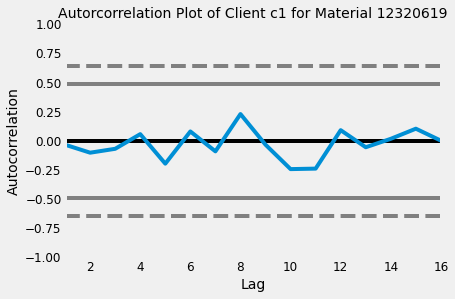

<Figure size 576x1152 with 0 Axes>

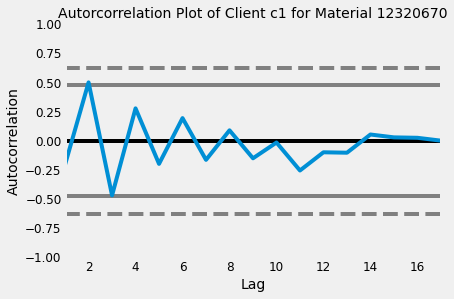

<Figure size 576x1152 with 0 Axes>

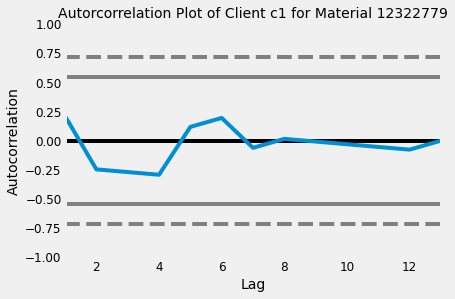

<Figure size 576x1152 with 0 Axes>

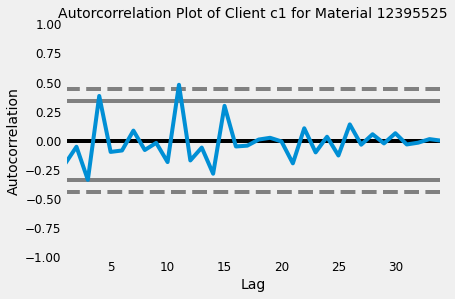

<Figure size 576x1152 with 0 Axes>

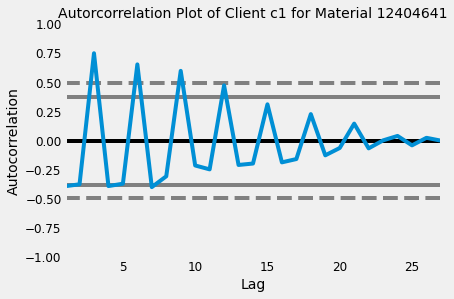

<Figure size 576x1152 with 0 Axes>

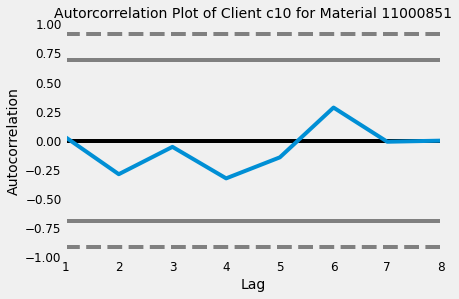

<Figure size 576x1152 with 0 Axes>

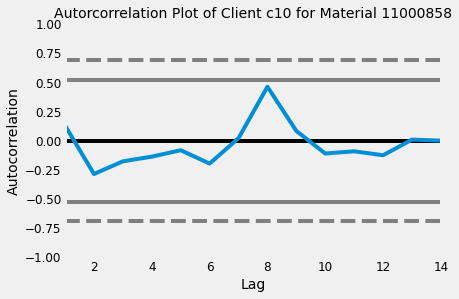

<Figure size 576x1152 with 0 Axes>

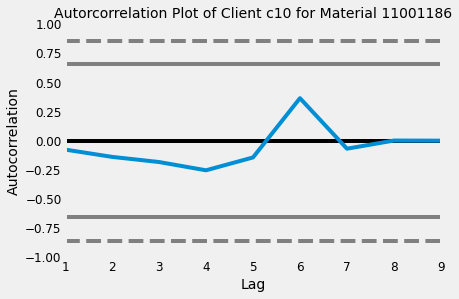

<Figure size 576x1152 with 0 Axes>

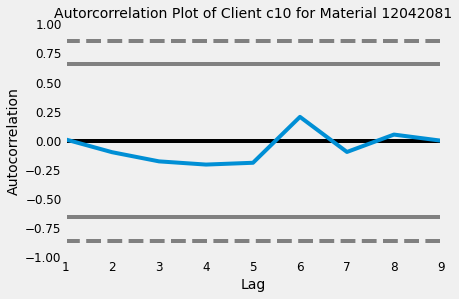

<Figure size 576x1152 with 0 Axes>

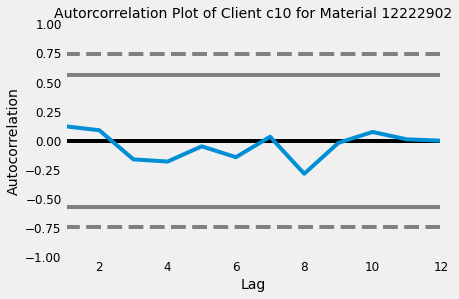

<Figure size 576x1152 with 0 Axes>

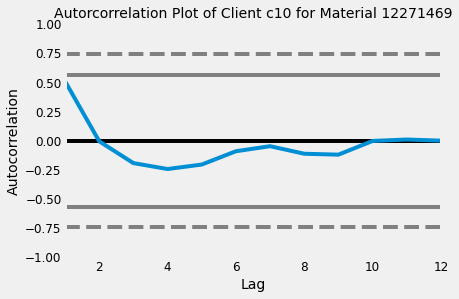

<Figure size 576x1152 with 0 Axes>

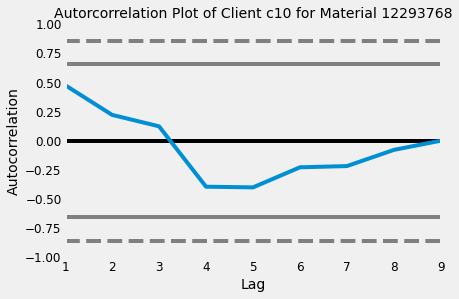

<Figure size 576x1152 with 0 Axes>

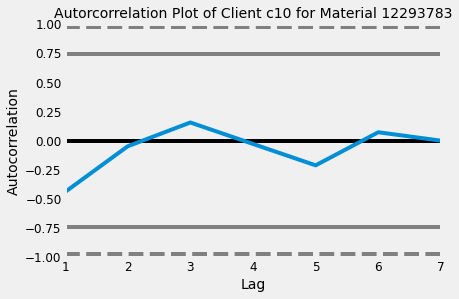

<Figure size 576x1152 with 0 Axes>

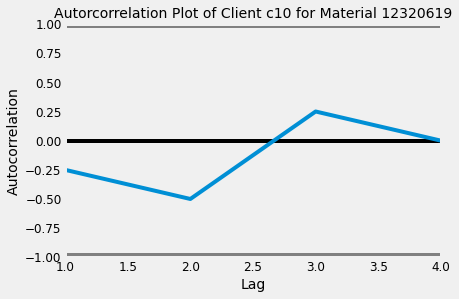

<Figure size 576x1152 with 0 Axes>

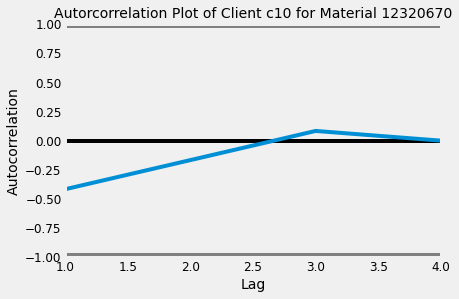

<Figure size 576x1152 with 0 Axes>

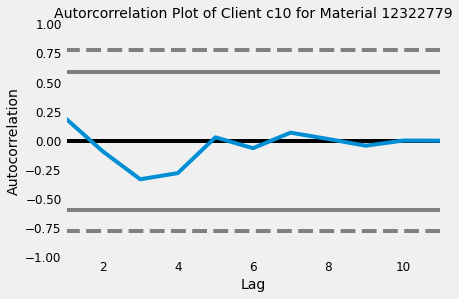

<Figure size 576x1152 with 0 Axes>

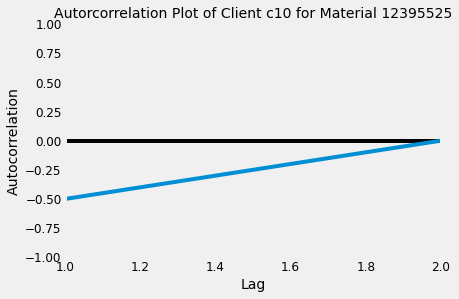

<Figure size 576x1152 with 0 Axes>

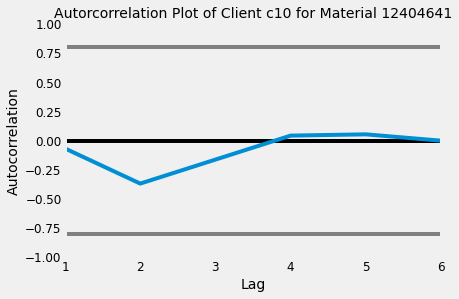

<Figure size 576x1152 with 0 Axes>

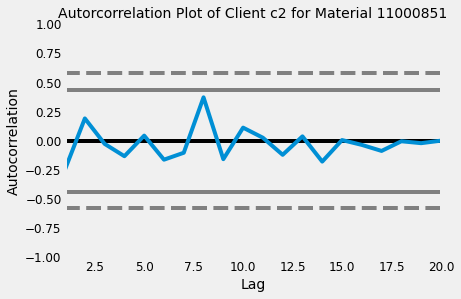

<Figure size 576x1152 with 0 Axes>

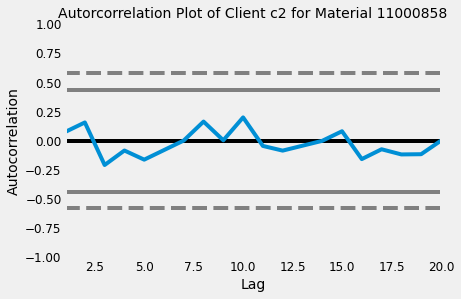

<Figure size 576x1152 with 0 Axes>

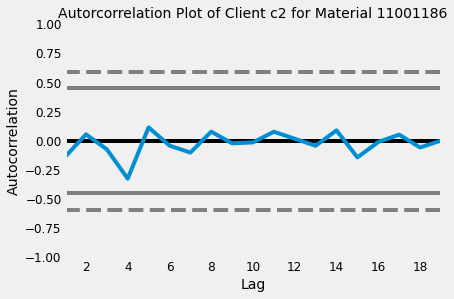

<Figure size 576x1152 with 0 Axes>

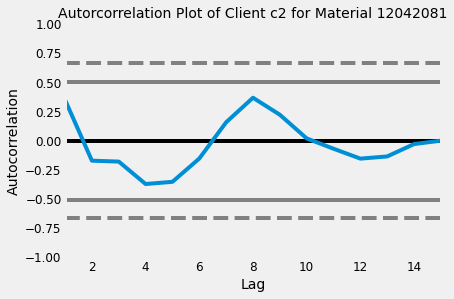

<Figure size 576x1152 with 0 Axes>

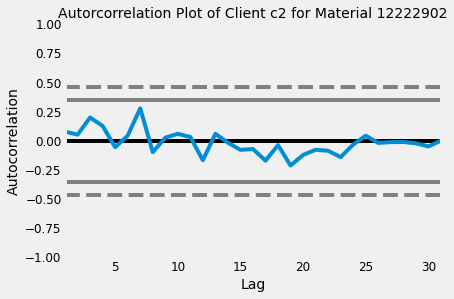

<Figure size 576x1152 with 0 Axes>

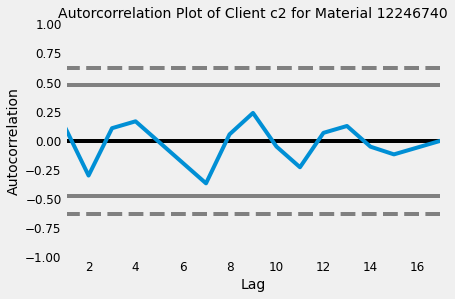

<Figure size 576x1152 with 0 Axes>

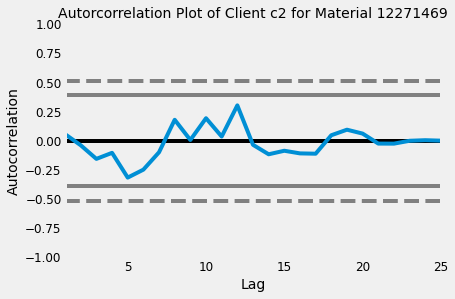

<Figure size 576x1152 with 0 Axes>

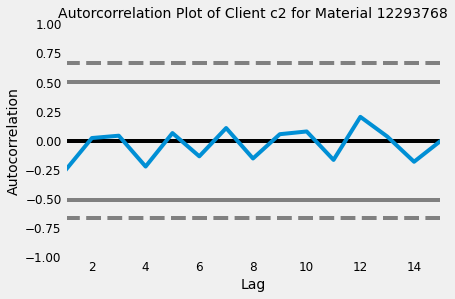

<Figure size 576x1152 with 0 Axes>

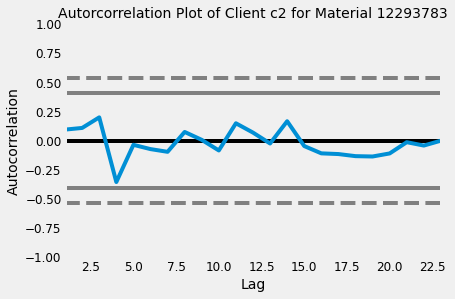

<Figure size 576x1152 with 0 Axes>

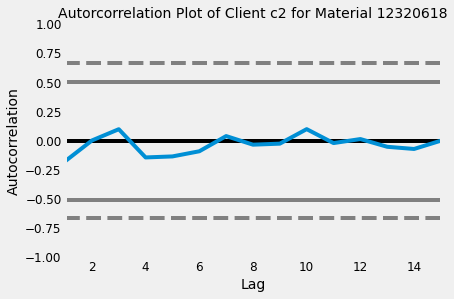

<Figure size 576x1152 with 0 Axes>

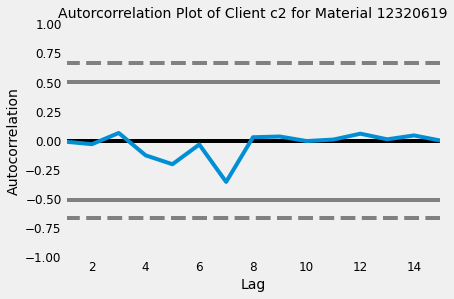

<Figure size 576x1152 with 0 Axes>

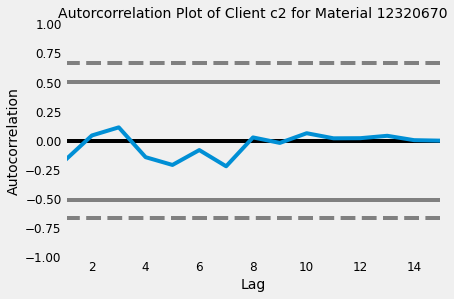

<Figure size 576x1152 with 0 Axes>

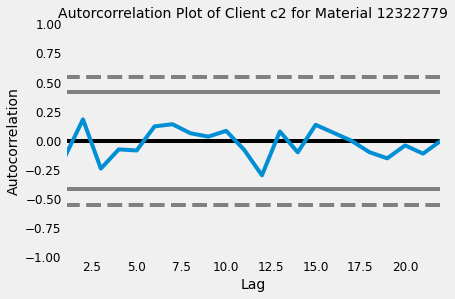

<Figure size 576x1152 with 0 Axes>

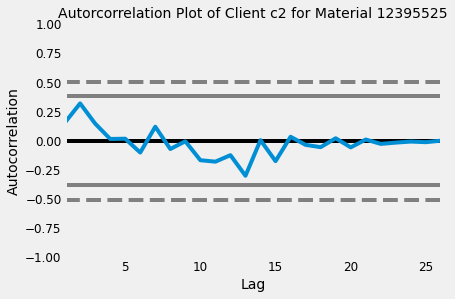

<Figure size 576x1152 with 0 Axes>

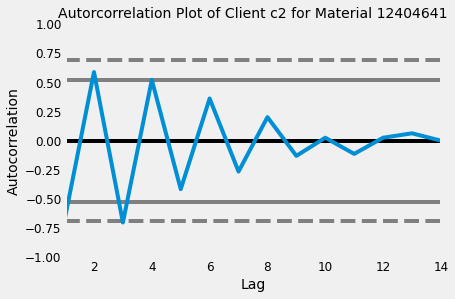

<Figure size 576x1152 with 0 Axes>

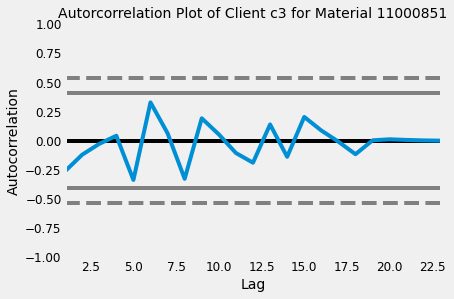

<Figure size 576x1152 with 0 Axes>

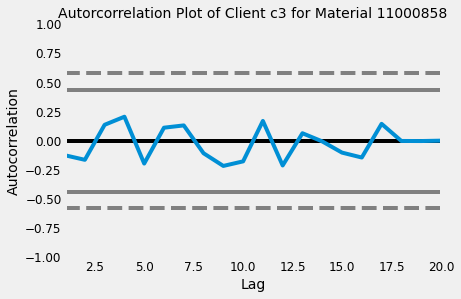

<Figure size 576x1152 with 0 Axes>

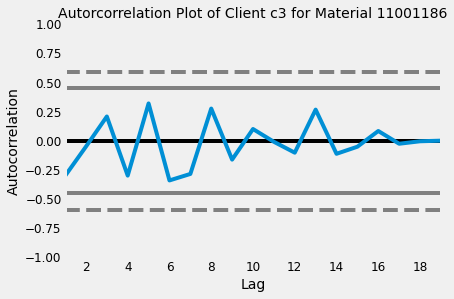

<Figure size 576x1152 with 0 Axes>

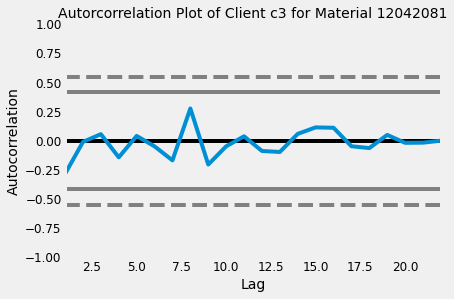

<Figure size 576x1152 with 0 Axes>

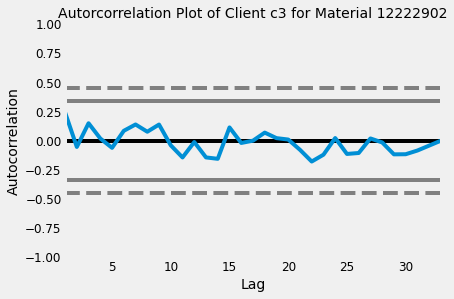

<Figure size 576x1152 with 0 Axes>

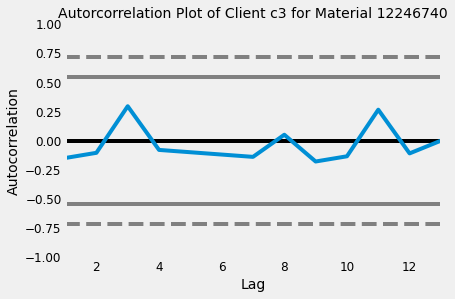

<Figure size 576x1152 with 0 Axes>

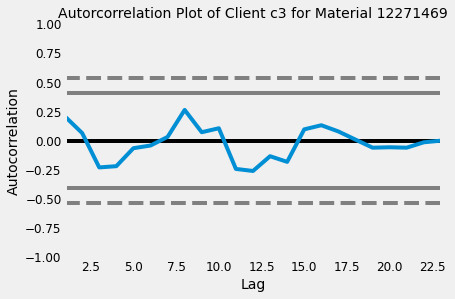

<Figure size 576x1152 with 0 Axes>

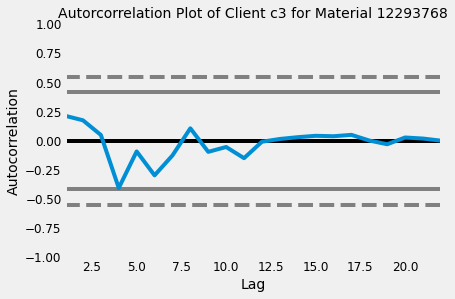

<Figure size 576x1152 with 0 Axes>

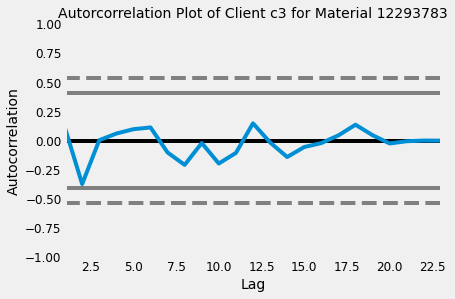

<Figure size 576x1152 with 0 Axes>

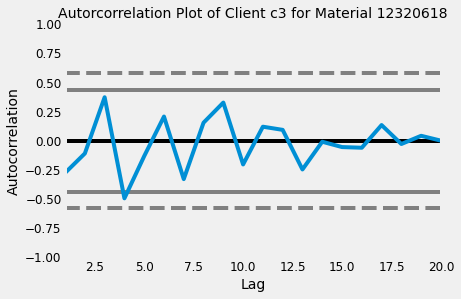

<Figure size 576x1152 with 0 Axes>

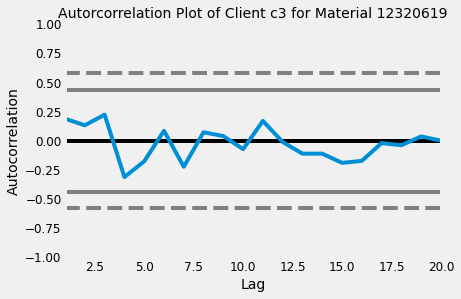

<Figure size 576x1152 with 0 Axes>

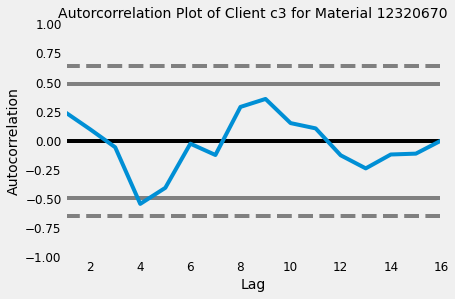

<Figure size 576x1152 with 0 Axes>

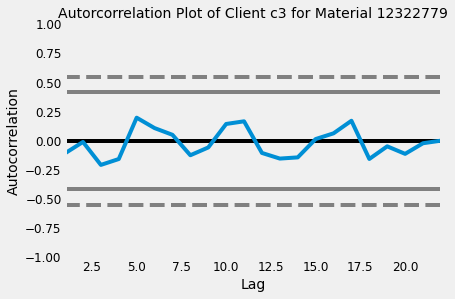

<Figure size 576x1152 with 0 Axes>

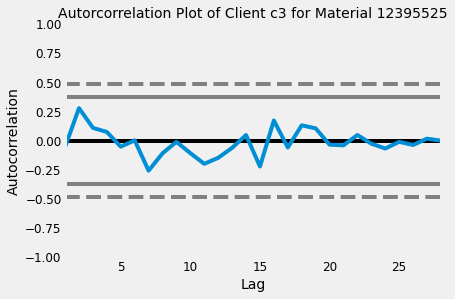

<Figure size 576x1152 with 0 Axes>

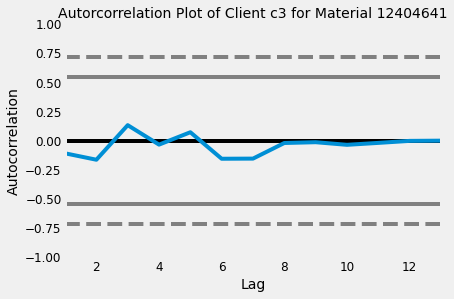

<Figure size 576x1152 with 0 Axes>

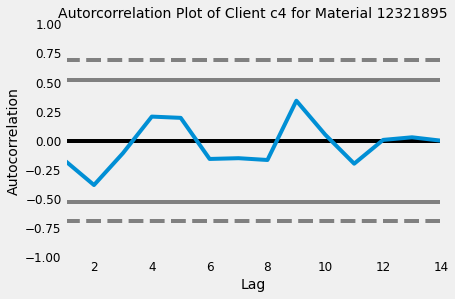

<Figure size 576x1152 with 0 Axes>

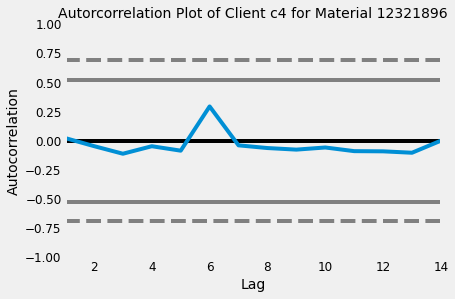

<Figure size 576x1152 with 0 Axes>

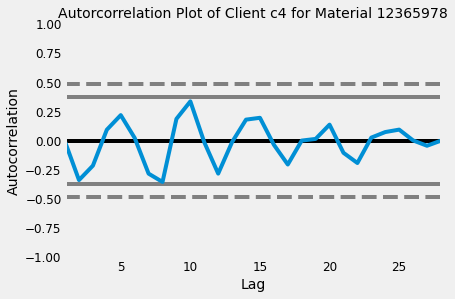

<Figure size 576x1152 with 0 Axes>

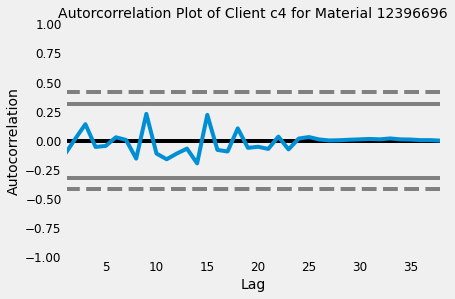

<Figure size 576x1152 with 0 Axes>

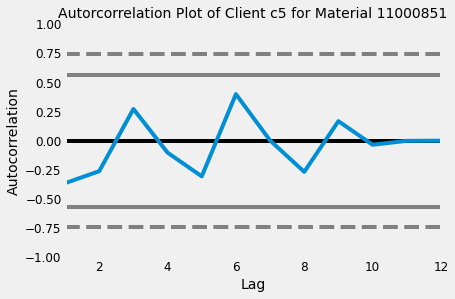

<Figure size 576x1152 with 0 Axes>

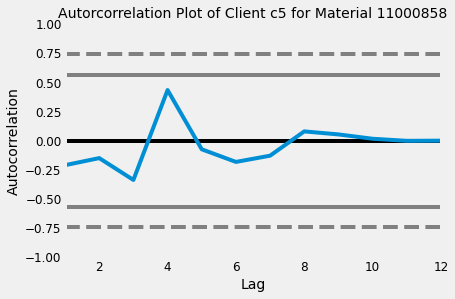

<Figure size 576x1152 with 0 Axes>

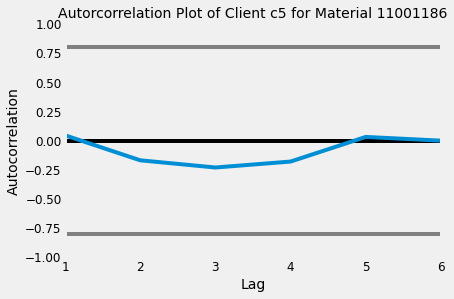

<Figure size 576x1152 with 0 Axes>

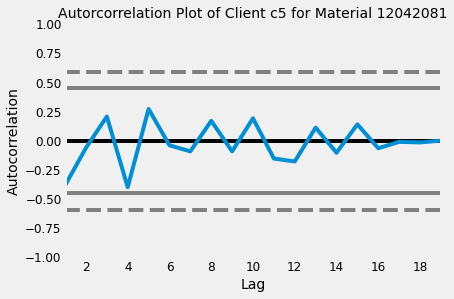

<Figure size 576x1152 with 0 Axes>

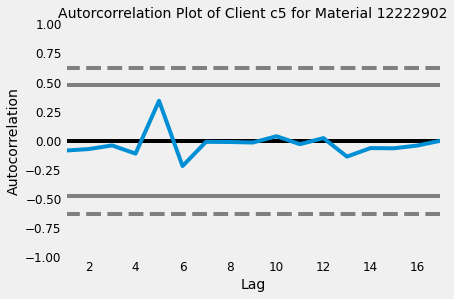

<Figure size 576x1152 with 0 Axes>

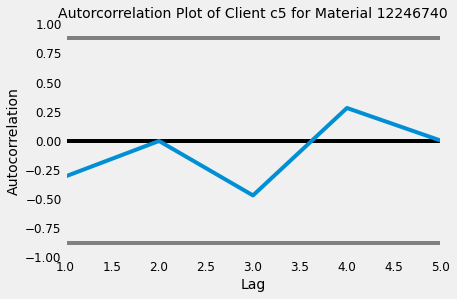

<Figure size 576x1152 with 0 Axes>

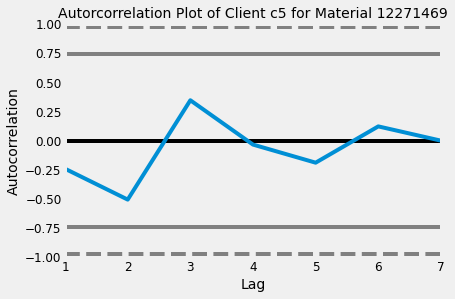

<Figure size 576x1152 with 0 Axes>

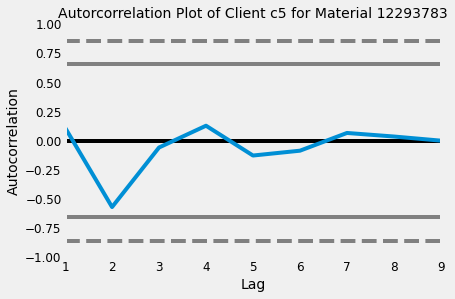

<Figure size 576x1152 with 0 Axes>

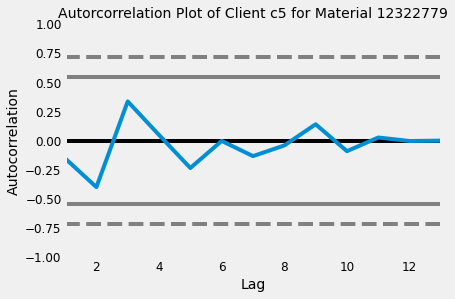

<Figure size 576x1152 with 0 Axes>

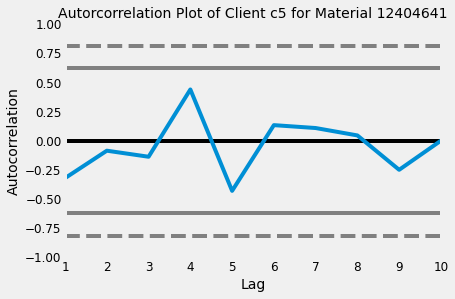

<Figure size 576x1152 with 0 Axes>

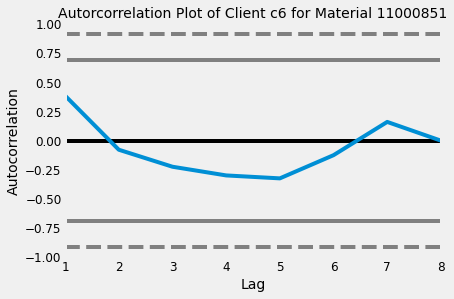

<Figure size 576x1152 with 0 Axes>

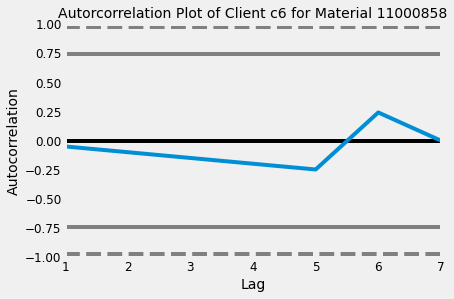

<Figure size 576x1152 with 0 Axes>

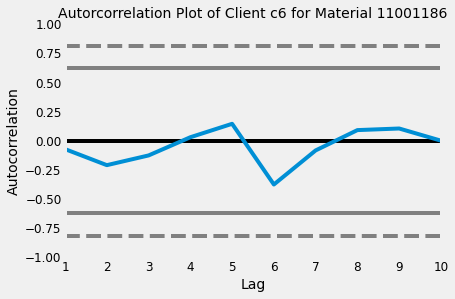

<Figure size 576x1152 with 0 Axes>

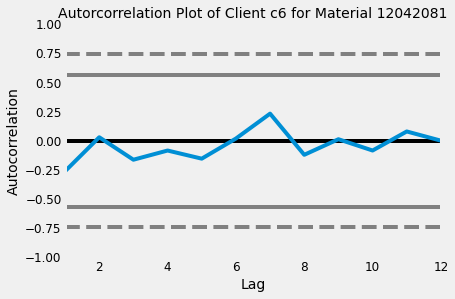

<Figure size 576x1152 with 0 Axes>

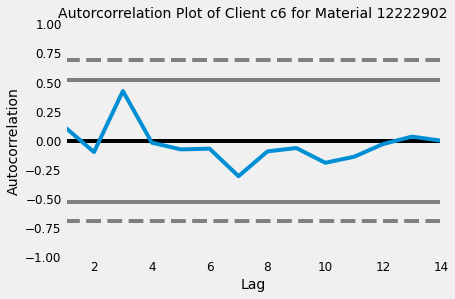

<Figure size 576x1152 with 0 Axes>

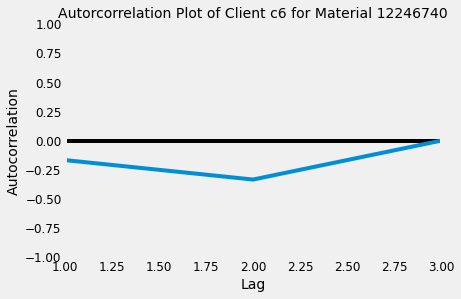

<Figure size 576x1152 with 0 Axes>

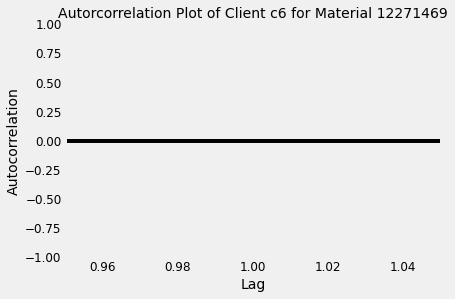

<Figure size 576x1152 with 0 Axes>

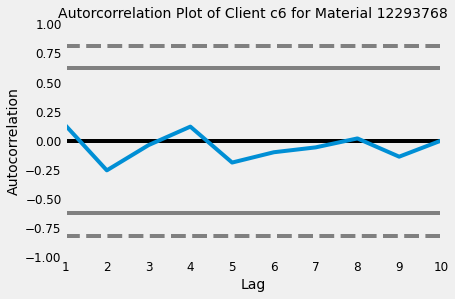

<Figure size 576x1152 with 0 Axes>

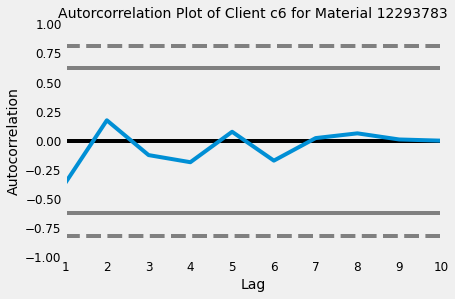

<Figure size 576x1152 with 0 Axes>

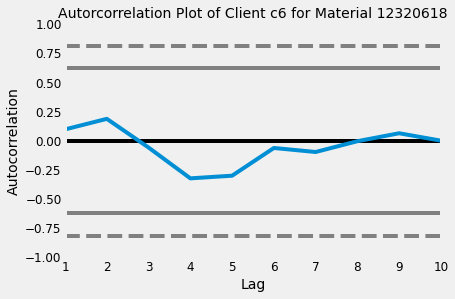

<Figure size 576x1152 with 0 Axes>

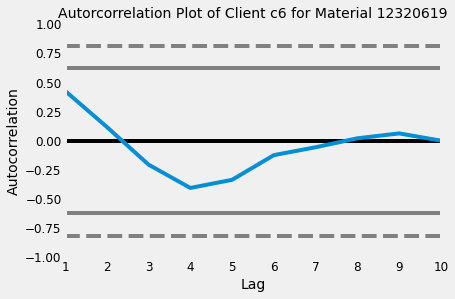

<Figure size 576x1152 with 0 Axes>

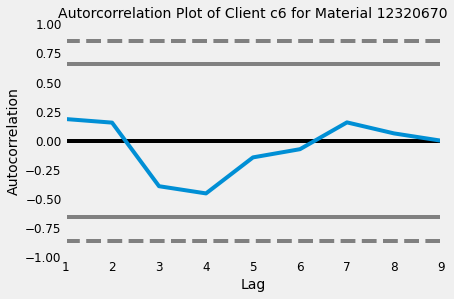

<Figure size 576x1152 with 0 Axes>

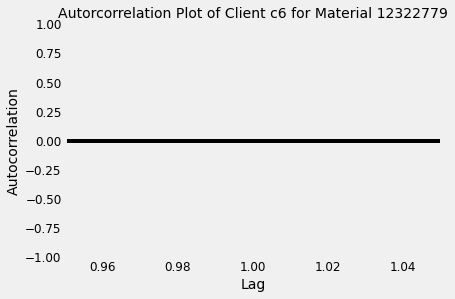

<Figure size 576x1152 with 0 Axes>

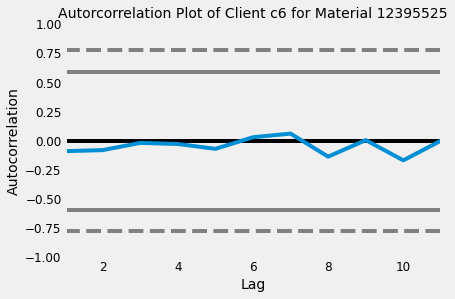

<Figure size 576x1152 with 0 Axes>

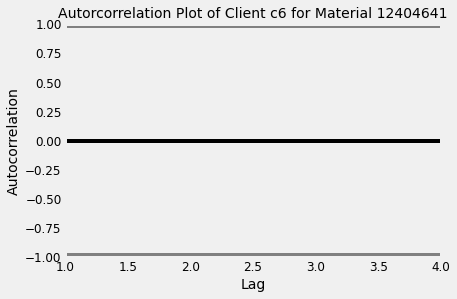

<Figure size 576x1152 with 0 Axes>

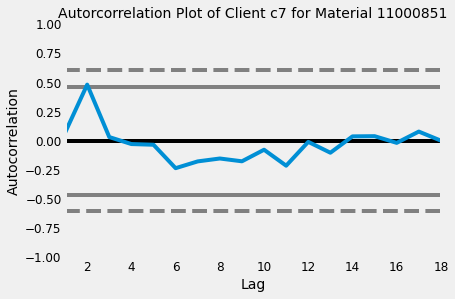

<Figure size 576x1152 with 0 Axes>

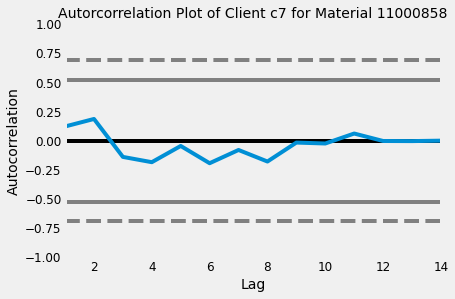

<Figure size 576x1152 with 0 Axes>

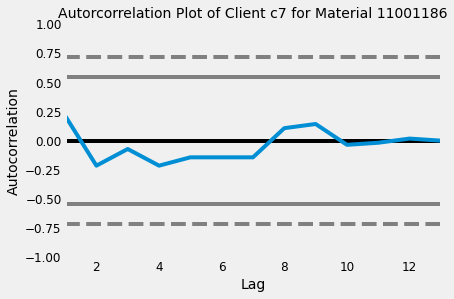

<Figure size 576x1152 with 0 Axes>

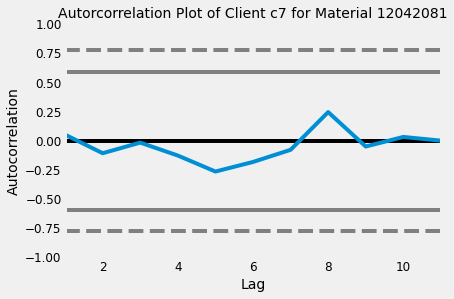

<Figure size 576x1152 with 0 Axes>

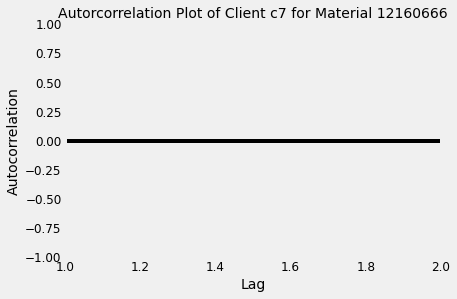

<Figure size 576x1152 with 0 Axes>

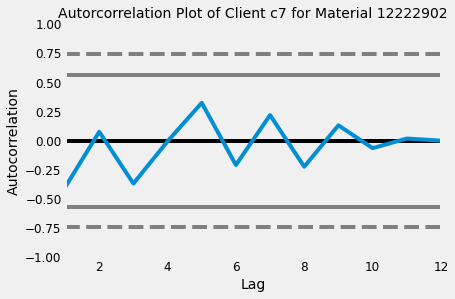

<Figure size 576x1152 with 0 Axes>

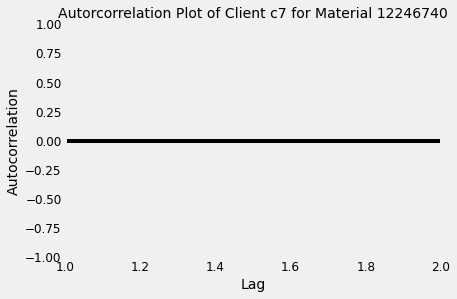

<Figure size 576x1152 with 0 Axes>

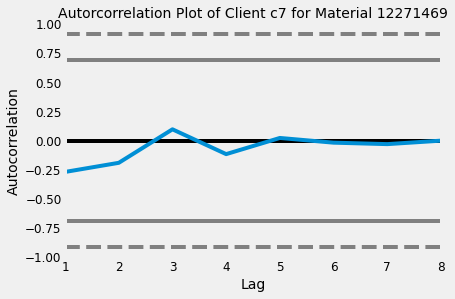

<Figure size 576x1152 with 0 Axes>

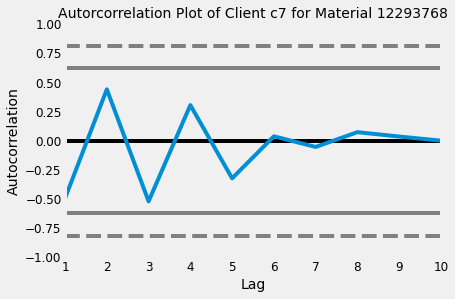

<Figure size 576x1152 with 0 Axes>

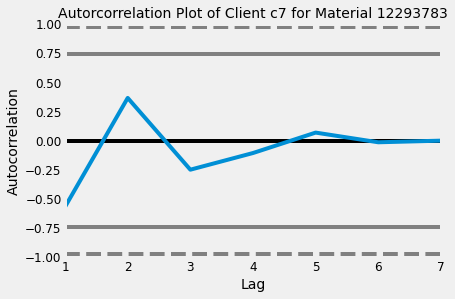

<Figure size 576x1152 with 0 Axes>

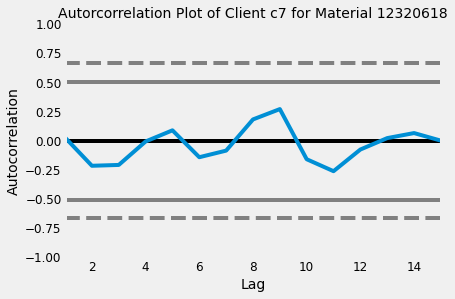

<Figure size 576x1152 with 0 Axes>

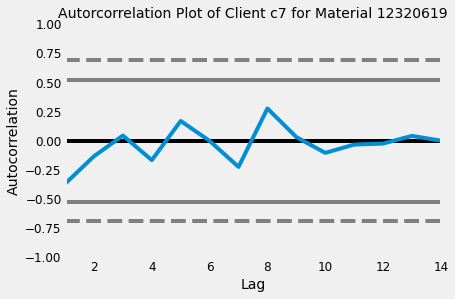

<Figure size 576x1152 with 0 Axes>

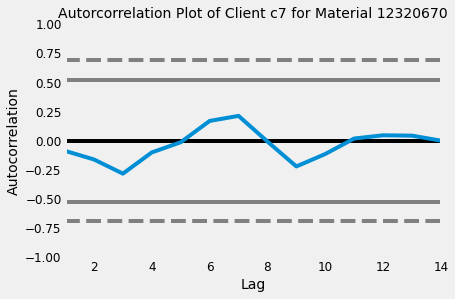

<Figure size 576x1152 with 0 Axes>

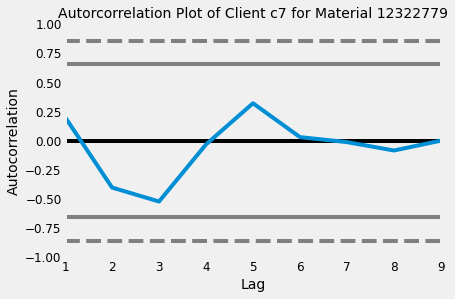

<Figure size 576x1152 with 0 Axes>

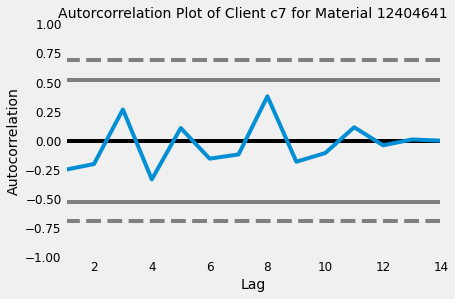

<Figure size 576x1152 with 0 Axes>

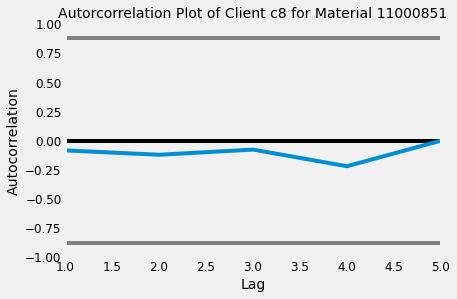

<Figure size 576x1152 with 0 Axes>

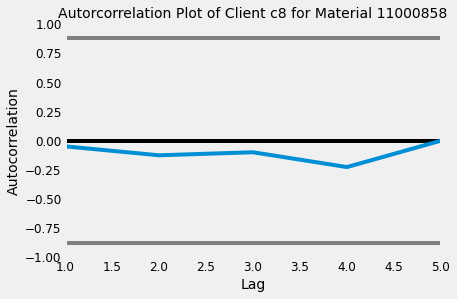

<Figure size 576x1152 with 0 Axes>

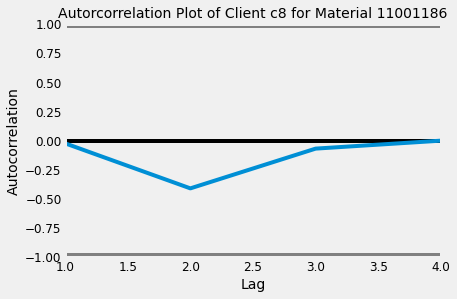

<Figure size 576x1152 with 0 Axes>

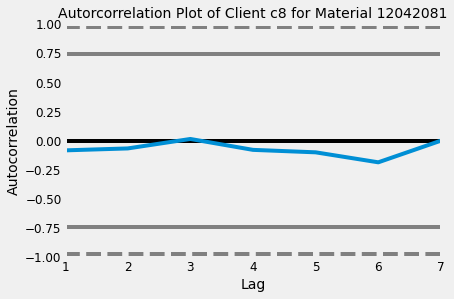

<Figure size 576x1152 with 0 Axes>

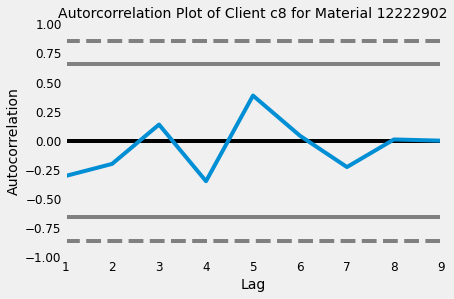

<Figure size 576x1152 with 0 Axes>

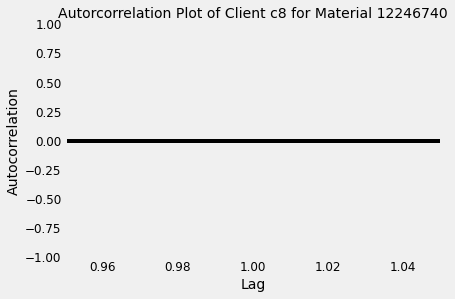

<Figure size 576x1152 with 0 Axes>

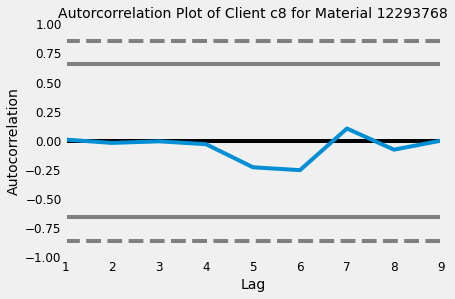

<Figure size 576x1152 with 0 Axes>

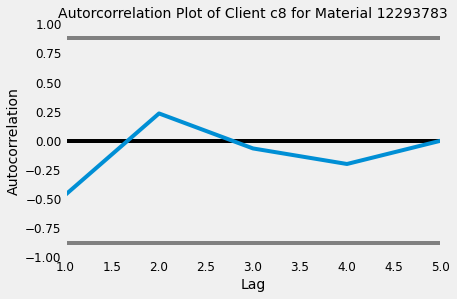

<Figure size 576x1152 with 0 Axes>

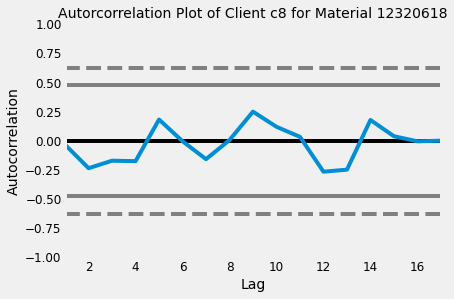

<Figure size 576x1152 with 0 Axes>

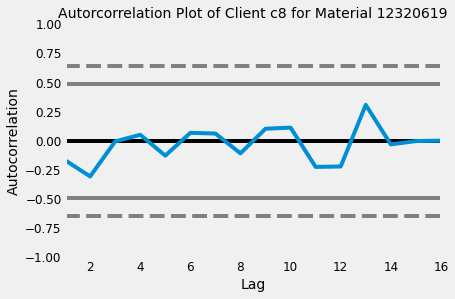

<Figure size 576x1152 with 0 Axes>

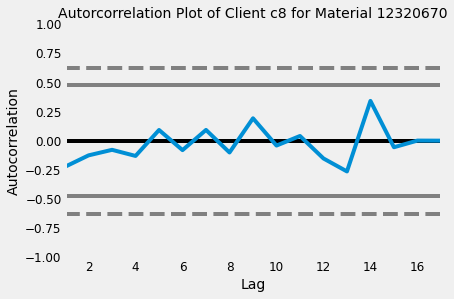

<Figure size 576x1152 with 0 Axes>

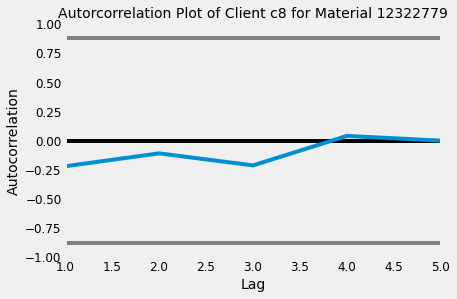

<Figure size 576x1152 with 0 Axes>

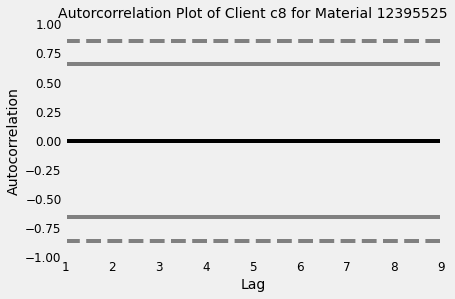

<Figure size 576x1152 with 0 Axes>

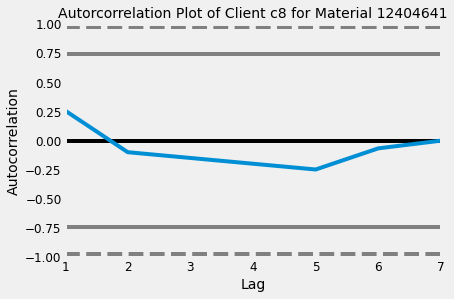

<Figure size 576x1152 with 0 Axes>

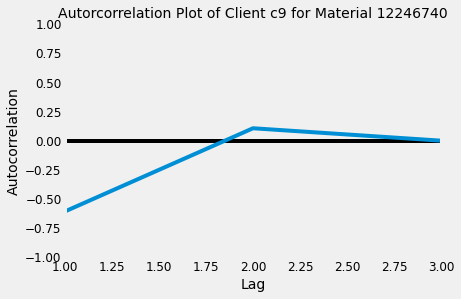

<Figure size 576x1152 with 0 Axes>

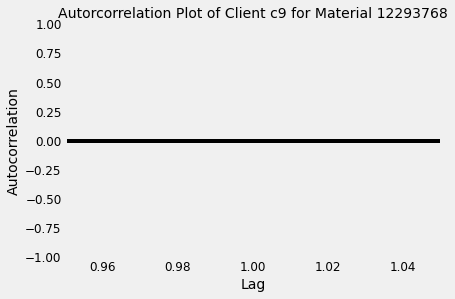

<Figure size 576x1152 with 0 Axes>

In [26]:
for i in range(len(unique_input)):
    subset = df_plt.loc[(df_plt['Client'] == unique_input.iloc[ i, 0 ]) & (df_plt['Material'] == unique_input.iloc[ i , 1 ])]
    subset = subset.drop(['Client', 'Material'], axis=1)
    autocorrelation_plot(subset)
    plt.title('Autorcorrelation Plot of Client {} for Material {}'.format(unique_input.iloc[i, 0], unique_input.iloc[i,1]),fontsize = 14)
    plt.figure(figsize=(8,16))
    plt.show()

### Time Series Fitting and Hyperparameter Tuning 

#### i) Model Fitting of Aggregate Demand for each Client 

In [27]:
model_ac_list = []
param_ac_list = []
RMSE_ac_list = []
model_df_ac = copy.deepcopy(filleddf_ac)
model_df_ac = model_df_ac.set_index('Date')
model_df_ac = model_df_ac.drop(['Material'], axis=1)
from statsmodels.tsa.arima.model import ARIMA
for i in range(len(client_list)):
    subset = model_df_ac.loc[(model_df_ac['Client'] == client_list[i])]
    subset.drop(['Client'], axis = 1)
    subset = subset.resample('d').sum()
    parameters =  [[0,0,1], [0,0,2],[0,0,3], [0,0,4], [0,0,5], [1,0,1], [1,0,2], [1,0,3], [1,0,4], [1,0,5]
              ,[1,1,1], [1,1,2], [1,1,3], [1,1,4], [1,1,5]]
    best_RMSE = 1e10
    best_param = [2,2,2]
    
    for j in range(len(parameters)):
        model_ht = ARIMA(subset, order = parameters[j])
        if np.sqrt(np.mean((model_ht.fit().resid)**2)) < best_RMSE :
            best_RMSE = np.sqrt(np.mean((model_ht.fit().resid)**2))
            best_param = parameters[j]
    model = ARIMA(subset, order = best_param)
    model_fit = model.fit()
    param_ac_list.append(best_param)
    RMSE_ac_list.append(best_RMSE)
    model_ac_list += [model_fit]

#### ii) Model Fitting of Aggregate Demand for each Material

In [28]:
model_am_list = []
param_am_list = []
RMSE_am_list = []
model_df_am = copy.deepcopy(filleddf_am)
model_df_am = model_df_am.set_index('Date')
model_df_am = model_df_am.drop(['Client'], axis=1)
for i in range(len(material_list)):
    subset = model_df_am.loc[(model_df_am['Material'] == material_list[i])]
    subset = subset.drop(['Material'], axis = 1)
    subset = subset.resample('d').sum()
    parameters =  [[0,0,1], [0,0,2],[0,0,3], [0,0,4], [0,0,5], [1,0,1], [1,0,2], [1,0,3], [1,0,4], [1,0,5]
              ,[1,1,1], [1,1,2], [1,1,3], [1,1,4], [1,1,5]]
    best_RMSE = 1e10
    best_param = [2,2,2]
    
    for j in range(len(parameters)):
        model_ht = ARIMA(subset, order = parameters[j])
        if np.sqrt(np.mean((model_ht.fit().resid)**2)) < best_RMSE :
            best_RMSE = np.sqrt(np.mean((model_ht.fit().resid)**2))
            best_param = parameters[j]
    model = ARIMA(subset, order = best_param)
    model_fit = model.fit()
    param_am_list.append(best_param)
    RMSE_am_list.append(best_RMSE)
    model_am_list += [model_fit]

#### iii)  Model Fitting for the Demand for each Unique Pair of Client and Material 

In [29]:
model_list = []
param_list = []
RMSE_list = []
model_df = copy.deepcopy(filleddf)
model_df = model_df.set_index('Date')

for i in range(len(unique_input)):
    subset = model_df.loc[(model_df['Client'] == unique_input.iloc[ i, 0 ]) & (model_df['Material'] == unique_input.iloc[ i , 1 ])]
    subset = subset.drop(['Client', 'Material'], axis=1)
    subset = subset.resample('d').sum()
    parameters =  [[0,0,1], [0,0,2],[0,0,3], [0,0,4], [0,0,5], [1,0,1], [1,0,2], [1,0,3], [1,0,4], [1,0,5]
              ,[1,1,1], [1,1,2], [1,1,3], [1,1,4], [1,1,5]]
    best_RMSE = 1e10
    best_param = [2,2,2]
    for j in range(len(parameters)):
        model_ht = ARIMA(subset, order = parameters[j])
        if np.sqrt(np.mean((model_ht.fit().resid)**2)) < best_RMSE :
            best_RMSE = np.sqrt(np.mean((model_ht.fit().resid)**2))
            best_param = parameters[j]
    model = ARIMA(subset, order = best_param)
    model_fit = model.fit()
    param_list.append(best_param)
    RMSE_list.append(best_RMSE)
    model_list += [model_fit]

#### Main ARIMA Forecasting Program

In [30]:
def ARIMA_Forecast(date, material, client):
    #check if pair, client, material exist 
   
    m_str = str(material)
    cm = str(client+m_str)
    
    if client not in client_list and client != 'all':
        print ('No existing client')
    elif material not in material_list and material != 0:
        print ('No existing material')
    elif cm not in combined and client != 'all'and material != 0:
        print('Client never purchased this material')
        
#find corresponding time series
    elif material == 0:
        model_index = np.asscalar(np.array((np.where(client_list == client ))))
        model = model_ac_list[model_index]
        forecast = model.predict(start=pd.to_datetime(date), dynamic=False)
        print ('The demand forecast of client {} is: {}'.format(client, forecast))
    elif client == 'all':
        model_index = np.asscalar(np.array((np.where(material_list == material ))))
        model = model_am_list[model_index]
        forecast = model.predict(start=pd.to_datetime(date), dynamic=False)
        print ('The demand forecast for material {} is: {}'.format(material, forecast))
    else:
        model_index = combined.index(cm)
        model = model_list[model_index]
        forecast = model.predict(start=pd.to_datetime(date), dynamic=False)
        print ('The demand forecast of client {} for material {} is: {}'.format(client, material, forecast))
            


# 4. Forecasting Program Instruction 
In both MA and ARIMA model, we assume that the client input denoted as "all" if client is not given while material input as "0" if material is not given. Both model follows a similar procedure.  

The user should follow the below instructions to acquire a forecasted demand for a given date. 

1. The input required for the function ARIMA_Forecast() is:  

    - client:  string; i.e. ‘c1’ 
     
     If client is not available, input ‘all’ for this field. 
     
    - material: integer; i.e. 11000581 

     If material is not available, input 0 for this field 

    - date: string,; i.e. ‘2020-02-26’

   If the client input is "all" and material is given, the function predicts the demand based on that material group for all clients on a given date. Similarly, if the material input is 0 and client is given, the function predicts the demand based on that client group for all material on a given date. 

 
2. The function will print out the forecasted demand on the given date for the given client and/or material. 

### 1) Moving Average

In [18]:
# Wrong client
ma_forecast('c11',12404641, '2020-01-05')

No existing client


In [19]:
# Wrong material
ma_forecast('c1',124046410, '2020-01-05')

No existing material


In [20]:
# No existing pair
ma_forecast('c1',12321895,'2020-01-05')

Client never purchased this material


In [21]:
# Client not given
ma_forecast('all',12404641,'2020-01-05')

The demand forecast for material 12404641 is: 350.2857142857143


In [22]:
# Material not given
ma_forecast('c1',0,'2020-01-05')

The demand forecast of client c1 is: 1352.7142857142858


In [23]:
# All given
ma_forecast('c1',12404641,'2020-01-05')

The demand forecast of client c1 for material 12404641 is: 98.28571428571429


### 2) Autoregressive Integrated Moving Average

In [31]:
# Wrong client input
ARIMA_Forecast('2020-02-26', 11000851,'c11')

No existing client


In [32]:
# Wrong material input
ARIMA_Forecast('2020-02-26', 110008510,'c1')

No existing material


In [33]:
# No existing pair
ARIMA_Forecast('2020-02-26', 12321895,'c1')

Client never purchased this material


In [34]:
# Client not given
ARIMA_Forecast('2020-02-26', 11000851,'all')

The demand forecast for material 11000851 is: 2020-02-26    497.591878
Freq: D, dtype: float64


In [35]:
# Material not given
ARIMA_Forecast('2020-02-26', 0,'c1')

The demand forecast of client c1 is: 2020-02-26    1286.38313
Freq: D, dtype: float64


In [36]:
# All given
ARIMA_Forecast('2020-02-26', 11000851,'c1')

The demand forecast of client c1 for material 11000851 is: 2020-02-26    86.512261
Freq: D, dtype: float64


# 4. Reference 
1.	Brownlee, J. How to Create an ARIMA Model for Time Series Forecasting in Python. 2017; Available from: https://machinelearningmastery.com/arima-for-time-series-forecasting-with-python/#:~:text=An%20ARIMA%20model%20is%20a,and%20forecasting%20time%20series%20data.&text=The%20use%20of%20differencing%20of,make%20the%20time%20series%20stationary. 

2.	Hansun, S. A new approach of moving average method in time series analysis. in 2013 Conference on New Media Studies (CoNMedia). 2013. 

3.	Nau, R., Forecasting with moving averages. 2014. 

4.	HAYES, A. Simple Moving Average (SMA). 2021; Available from: https://www.investopedia.com/terms/s/sma.asp. 

5.	Prabhakaran, S. ARIMA Model – Complete Guide to Time Series Forecasting in Python. Available from: https://www.machinelearningplus.com/time-series/arima-model-time-series-forecasting-python/. 

6.	Binhuraib, T. An Introduction to Time Series Analysis with ARIMA. 2021; Available from: https://towardsdatascience.com/an-introduction-to-time-series-analysis-with-arima-a8b9c9a961fb. 

7.	Meyler, A.a.K., Geoff and Quinn, Terry, Forecasting irish inflation using ARIMA models. 1998. 